In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.models import load_model
from keras import activations
import numpy as np
import pickle
import os
from keras.models import load_model
from skimage.transform import resize
from tqdm import tqdm
import copy
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

"""
##### ***Data & Black-Box***

"""

# IMPORTO I DATI PER VOTTIGNASCO


# Ottieni il percorso effettivo da una variabile d'ambiente
work_path = os.environ['WORK']  # Ottieni il valore della variabile d'ambiente WORK
v_test_OHE_path = os.path.join(work_path, "Water_Resources/rise-video/data/Vottignasco/Vottignasco_00425010001_test_month_OHE.npy")
v_test_image_path = os.path.join(work_path, "Water_Resources/rise-video/data/Vottignasco/Vottignasco_00425010001_test_normalized_image_sequences.npy")
v_test_target_dates_path = os.path.join(work_path, "Water_Resources/rise-video/data/Vottignasco/Vottignasco_00425010001_test_target_dates.npy")
v_test_images_test_dates = os.path.join(work_path, "Water_Resources/rise-video/data/Vottignasco/Vottignasco_00425010001_test_image_sequences_dates.npy")

# Carica l'array numpy dai file
vottignasco_test_OHE    = np.load(v_test_OHE_path)
vottignasco_test_image  = np.load(v_test_image_path)
vottignasco_test_dates  = np.load(v_test_target_dates_path)
vottignasco_test_images_dates = np.load(v_test_images_test_dates)

print(len(vottignasco_test_dates))
print(len(vottignasco_test_image))
print(len(vottignasco_test_OHE))

2025-03-05 09:39:33.992440: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-05 09:39:35.756375: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-05 09:39:40.095081: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-05 09:39:40.098267: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-05 09:39:40.568719: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to

105
105
105


In [3]:

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import copy


def get_index_range_for_season(seasons):
  indices_range_season = []  # sarà istanziata con triplette (start_index, end_index, season) per ogni stagione

  season_prev = seasons[0]  # Inizializzo con la prima stagione al time-step 0
  start_index = 0

  for i, season in enumerate(seasons):
    if (season != season_prev):
      #print("Ok è cambiata la stagione al time-step", i)
      indices_range_season.append((start_index, i-1, season_prev))
      season_prev = season
      start_index = i

    # Caso in cui negli ultimi time step ho una stagione differente!
    if (i==103):
      last_triple = indices_range_season[-1:]
      if (last_triple[0][2] != season_prev):
        indices_range_season.append((last_triple[0][1] + 1, 103, seasons[103]))

  return indices_range_season

def get_season(day):
  spring = np.arange(80, 172)
  summer = np.arange(172, 264)
  fall = np.arange(264, 355)

  if day in spring:
    season = 'Spring'
  elif day in summer:
    season = 'Summer'
  elif day in fall:
    season = 'Autumn'
  else:
    season = 'Winter'

  return season

def plot_sv_mean_per_season(sv_nr_instance, nr_instance, cmap='Reds'):
  date_target = vottignasco_test_dates[nr_instance].astype('datetime64[D]')

  x1_i = copy.deepcopy(vottignasco_test_image[nr_instance])
  x1_i_dates = copy.deepcopy(vottignasco_test_images_dates[nr_instance])

  dates = pd.to_datetime(x1_i_dates)

  tm_days = [date.timetuple().tm_yday for date in dates]
  seasons = [get_season(tm_yday) for tm_yday in tm_days]

  # Ottieni le triplette (indice_iniziale, indice_finale, stagione)
  indices_range_season = get_index_range_for_season(seasons)

  # Nel caso di 9 stagioni creo un griglia 3x4, altrimenti 2x4
  if len(indices_range_season) == 9:
    # Imposta i plot in una griglia 3x4
    fig, axes = plt.subplots(3, 4, figsize=(15, 14))
  else:
    fig, axes = plt.subplots(2, 4, figsize=(15, 14))
  axes = axes.flatten()  # Converti la matrice di subplot in una lista

  # Trova i valori minimo e massimo per la colorbar
  vmin = np.min(sv_nr_instance)
  vmax = np.max(sv_nr_instance)

  for i, (index_start, index_end, season) in enumerate(indices_range_season):
      if index_start == index_end:
          sv_mean_season = sv_nr_instance[index_start]
      else:
          sv_mean_season = np.mean(sv_nr_instance[index_start:index_end], axis=0)

      im = axes[i].imshow(sv_mean_season, cmap=cmap, vmin=vmin, vmax=vmax, origin='lower')
      year = x1_i_dates[index_end].astype('datetime64[Y]').astype(int) + 1970
      axes[i].set_title(f'Mean Saliency-Video - {season}, {year}', fontdict={'fontsize': 10})
      x_ticks = np.arange(0, 8, step=1)  # crea tick ogni 1
      axes[i].set_xticks(x_ticks)

  # Disattiva gli assi vuoti
  for j in range(i + 1, len(axes)):
      axes[j].axis('off')

  # Riduci lo spazio bianco tra i subplot
  plt.tight_layout()

  if len(indices_range_season) == 9:
    # Aggiusta i margini e riduci ulteriormente hspace e wspace per avvicinare i subplot
    fig.subplots_adjust(left=0.05, right=0.85, top=0.92, bottom=0.40, hspace=0.12, wspace=0.12)
    # Aggiungi la colorbar a destra dei subplot
    cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.02, pad=0.05, use_gridspec=True, aspect=25)
  else:
    fig.subplots_adjust(left=0.05, right=0.85, top=0.92, bottom=0.60, hspace=0.15, wspace=0.15)
    cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.02, pad=0.05, use_gridspec=True, aspect=16)

  cbar.set_label('Saliency', fontsize=11)

  # Titolo principale
  fig.suptitle(f'Mean Saliency-Video per Season on instance no. {nr_instance}, Date: {date_target}', fontsize=16)

  # Salva la figura con dpi=400
  #plt.savefig(f'/content/sv_per_season_vott_norm_{nr_instance}.png', dpi=400, bbox_inches='tight')
  #plt.savefig(f'./MyDrive/Water_Resources/results/spatial-temporal/sv_mean_per_season/sv_per_season_vott_norm_{nr_instance}.png', dpi=400, bbox_inches='tight')

  plt.show()
  plt.close(fig)

In [4]:
def calculate_auc(x, y):
    """
    Calcola l'area sotto la curva (AUC) utilizzando il metodo del trapezio.

    :param x: Valori dell'asse x (frazione dei pixel/frame inseriti).
    :param y: Valori dell'asse y (errori calcolati).
    :return: Area sotto la curva.
    """
    return np.trapz(y, x)

def plot_mean_insertion_curve(all_errors_insertion, title="Mean Insertion Curve"):
  mean_errors_for_insertion_vott = np.mean(all_errors_insertion, axis=0)

  # Plot della curva dell'errore e area sotto la curva (AUC)
  #x = np.arange(0, mean_errors_for_insertion_vott.shape[0])
  # Crea un array di frazioni di pixel inseriti (da 0 a 1)
  x = np.linspace(0, 1, mean_errors_for_insertion_vott.shape[0])
  auc = calculate_auc(x, mean_errors_for_insertion_vott)

  plt.plot(x, mean_errors_for_insertion_vott, label='Error Curve')
  # Pallini blu sui punti della curva
  #plt.scatter(x, mean_errors_for_insertion_vott, color='blue', zorder=3)
  plt.fill_between(x, mean_errors_for_insertion_vott, color='skyblue', alpha=0.4)

  # Aggiungi un box con l'AUC sotto la legenda
  auc_text = f'AUC = {auc:.2f}'
  plt.legend(loc='upper right')
  plt.gca().add_artist(plt.legend(['Error Curve']))  # Legenda principale
  plt.text(0.95, 0.83, auc_text, transform=plt.gca().transAxes,
             fontsize=9, verticalalignment='bottom', horizontalalignment='right',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='square,pad=0.5'))

  plt.xlabel('Fraction of pixels inserted')
  plt.ylabel('Mean Squared Error')
  plt.grid(True, linestyle='--', alpha=0.6)  # Griglia più leggibile
  plt.title(title)
  plt.legend()
  plt.show()

def plot_mean_deletion_curve(all_errors_deletion, title="Mean Deletion Curve"):
  mean_errors_for_deletion_vott = np.mean(all_errors_deletion, axis=0)

  # Plot della curva dell'errore e area sotto la curva (AUC)
  #x = np.arange(0, mean_errors_for_deletion_vott.shape[0])  # Array da 0 a 40 inclusi
  x = np.linspace(0, 1, mean_errors_for_deletion_vott.shape[0])
  auc = calculate_auc(x, mean_errors_for_deletion_vott)

  plt.plot(x, mean_errors_for_deletion_vott, label='Error Curve')
  # Pallini red sui punti della curva
  #plt.scatter(x, mean_errors_for_deletion_vott, color='red', zorder=3)
  plt.fill_between(x, mean_errors_for_deletion_vott, color='lightcoral', alpha=0.4)

  # Aggiungi un box con l'AUC sotto la legenda
  auc_text = f'AUC = {auc:.2f}'
  plt.legend(loc='upper right')
  plt.gca().add_artist(plt.legend(['Error Curve']))  # Legenda principale
  plt.text(0.18, 0.83, auc_text, transform=plt.gca().transAxes,
             fontsize=9, verticalalignment='bottom', horizontalalignment='right',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='square,pad=0.5'))

  plt.xlabel('Fraction of pixels removed')
  plt.ylabel('Mean Squared Error')
  plt.grid(True, linestyle='--', alpha=0.6)  # Griglia più leggibile
  plt.title(title)
  plt.legend()
  plt.show()

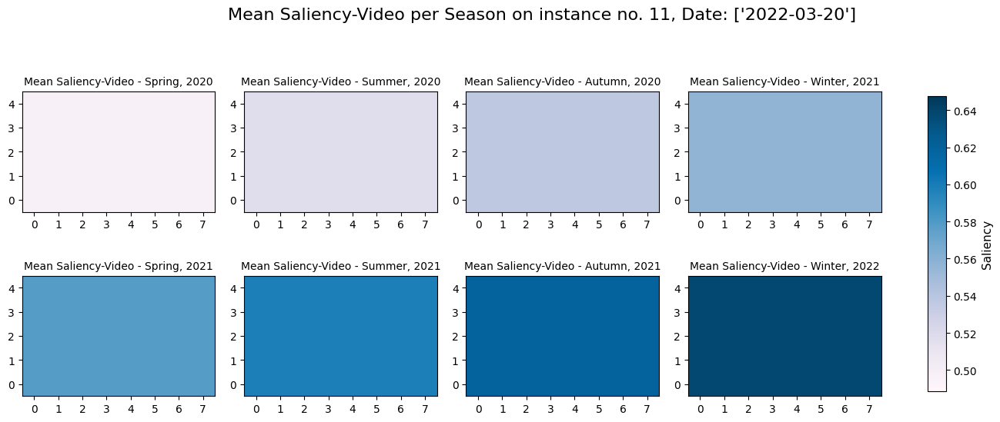

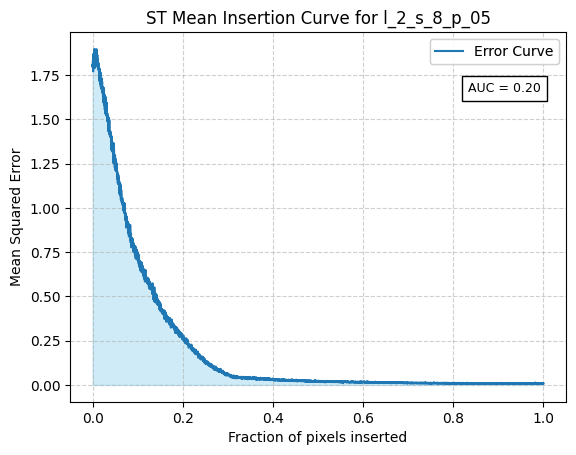

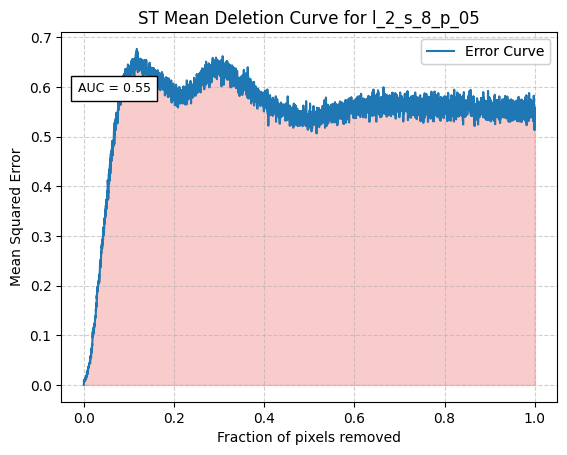

In [5]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/st_results_setup_l_2_s_8_p_05_inv_sigmoide.pkl")
# Salvataggio della lista results in un file pickle
with open(path_to_load_results, 'rb') as file:
  result_st = pickle.load(file)
  #result_st.append(setup)

nr_instance = 11

all_errors_insertion = result_st["errors_insertion"]
all_errors_deletion = result_st["errors_deletion"]

saliency_video_i = result_st["saliency_videos"][nr_instance]

plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")

parameters = result_st["parameters_comb"]

plot_mean_insertion_curve(all_errors_insertion, title=f"ST Mean Insertion Curve for {parameters}")
plot_mean_deletion_curve(all_errors_deletion,  title=f"ST Mean Deletion Curve for {parameters}")

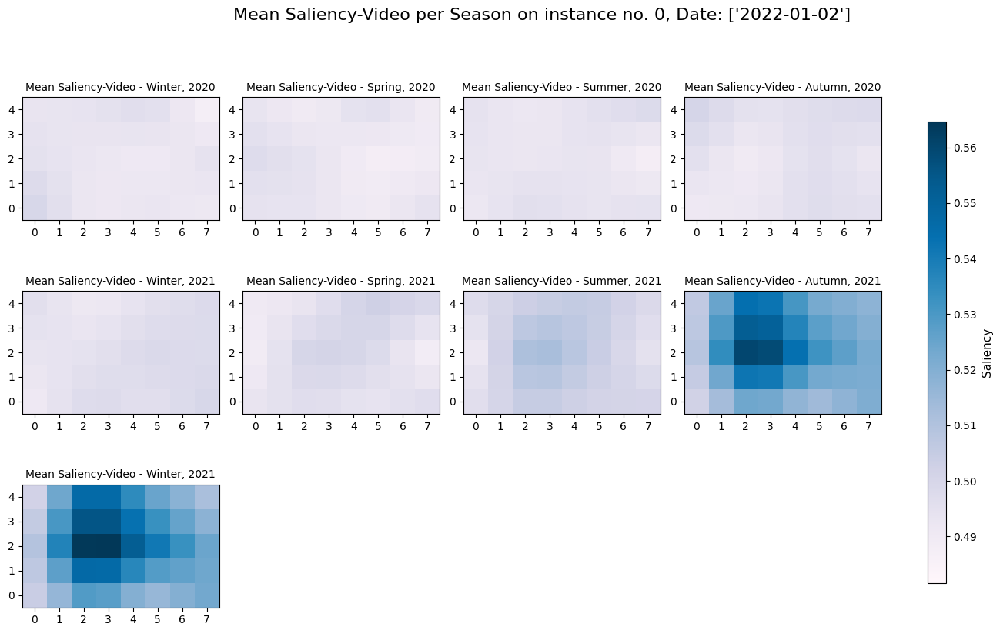

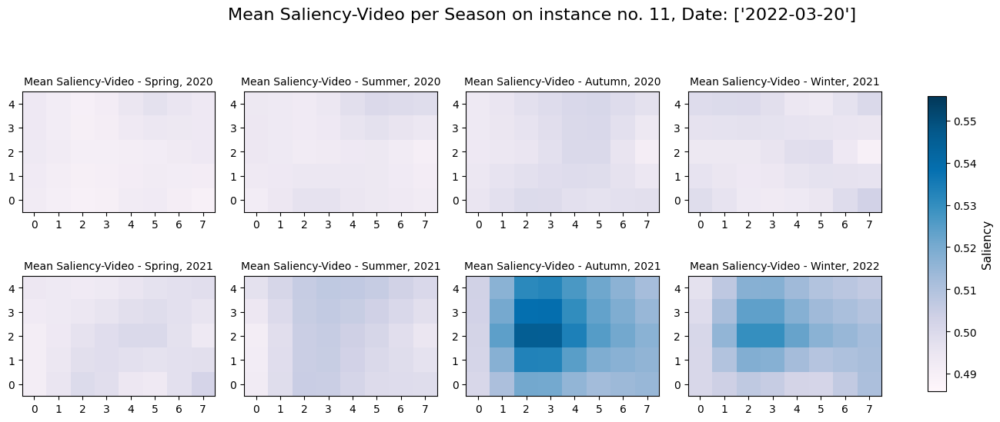

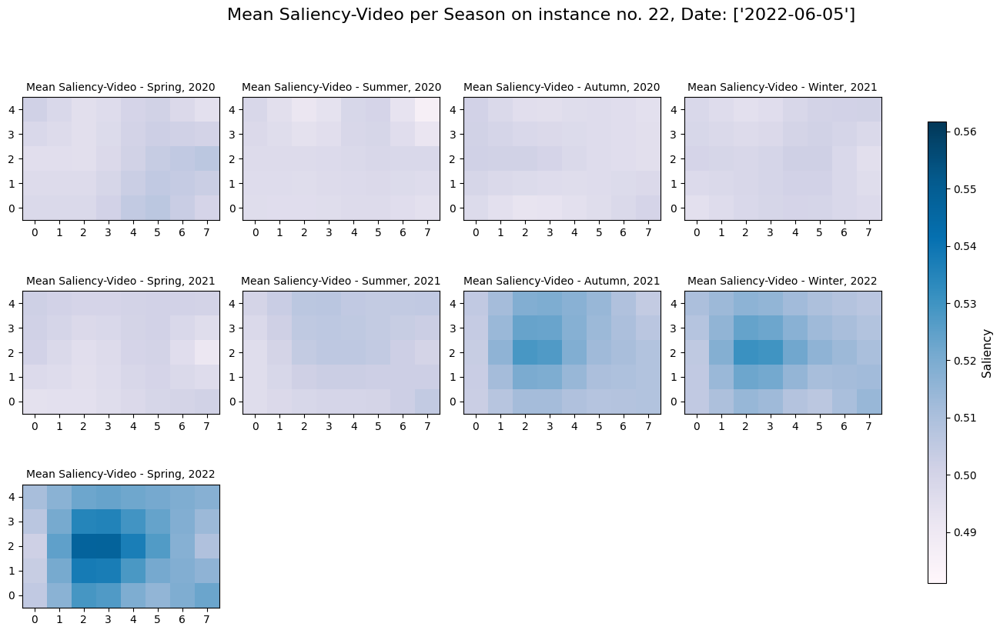

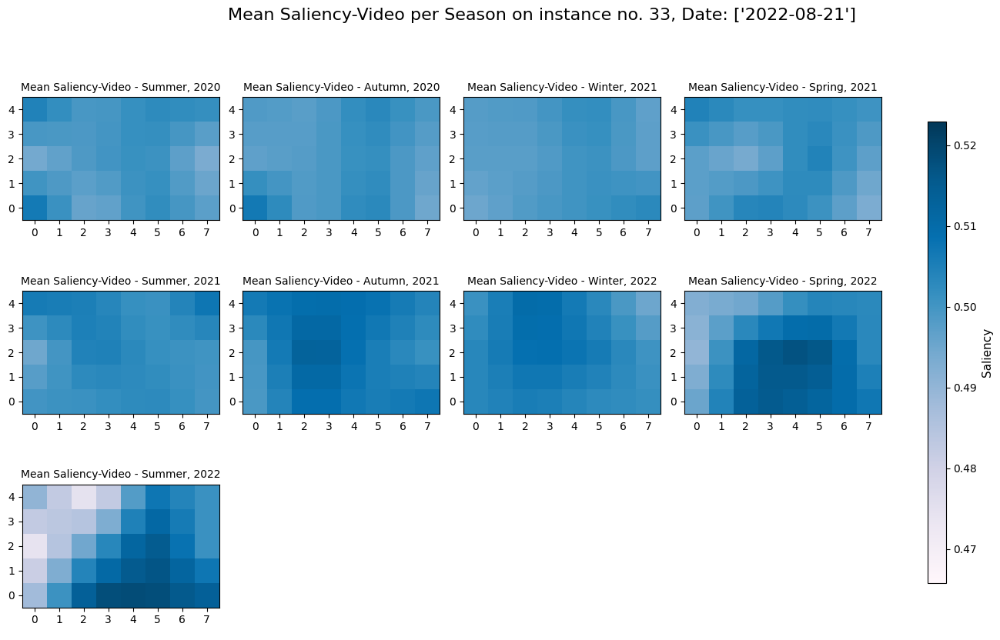

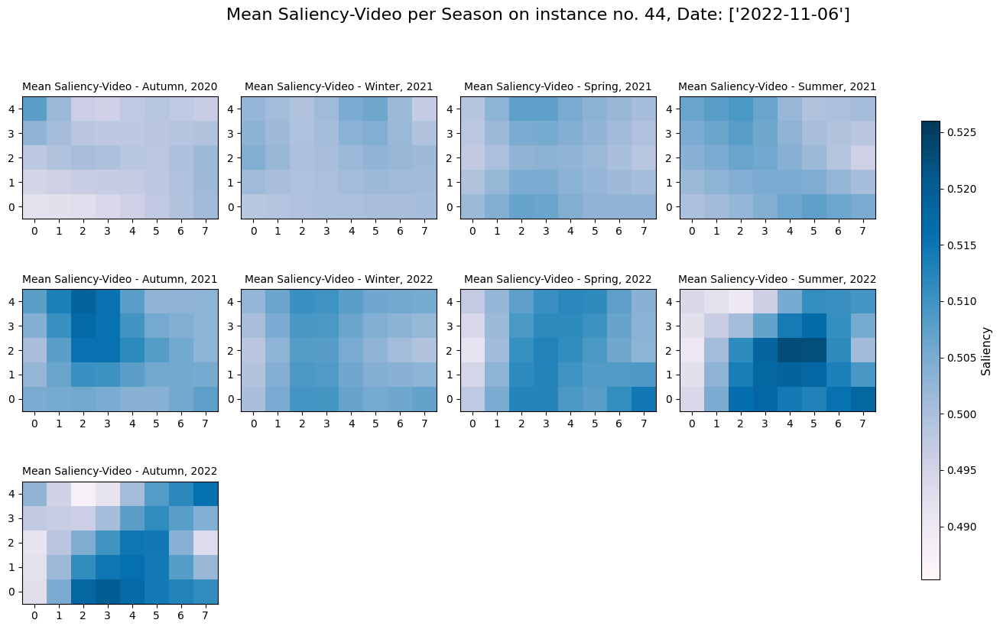

...

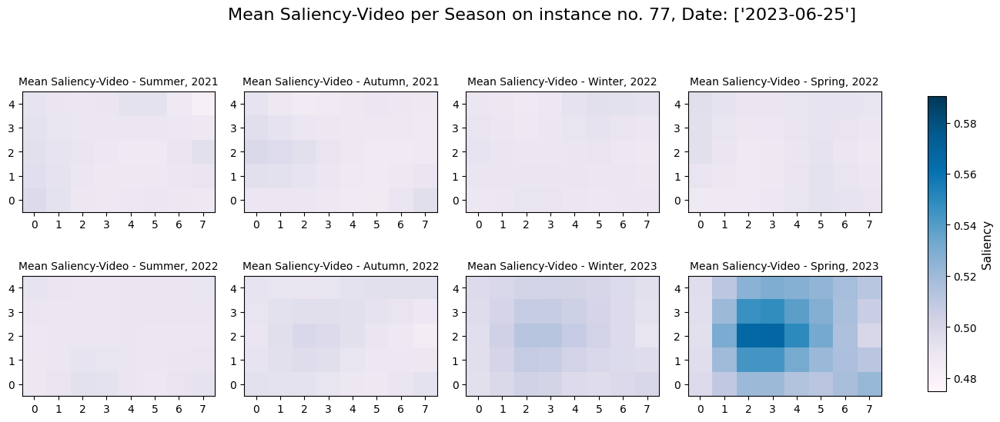

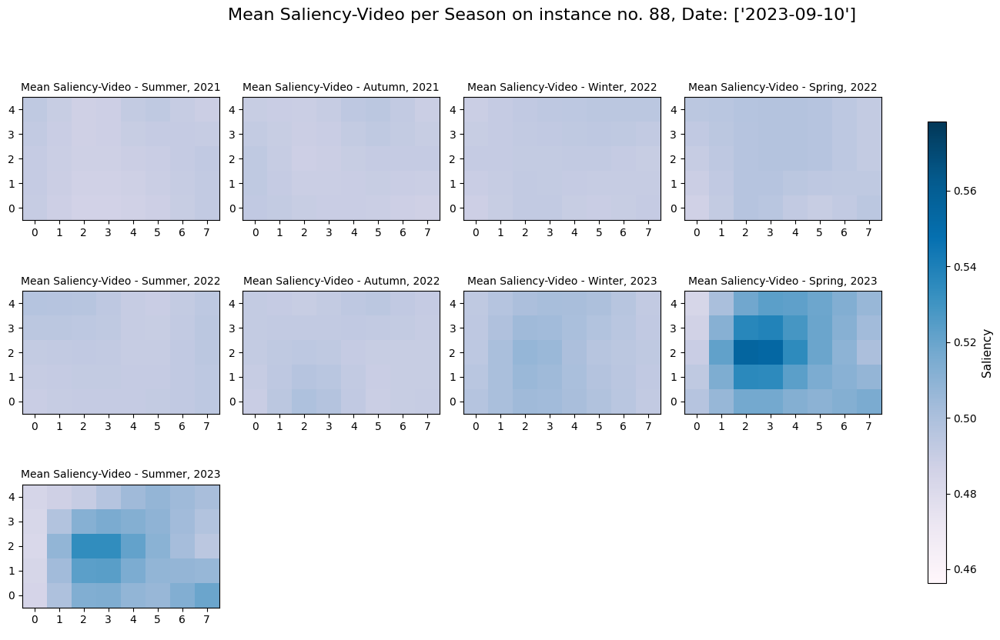

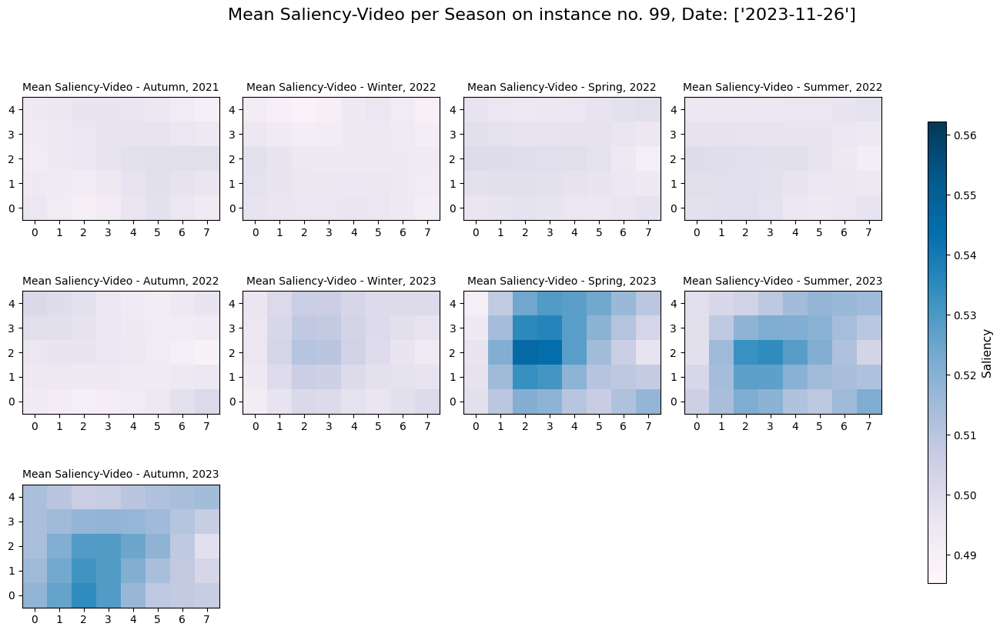

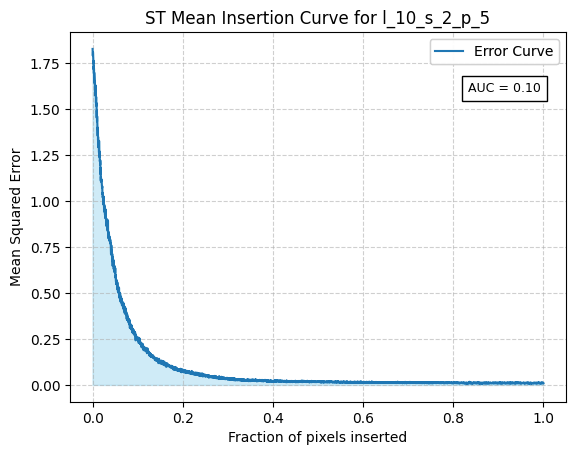

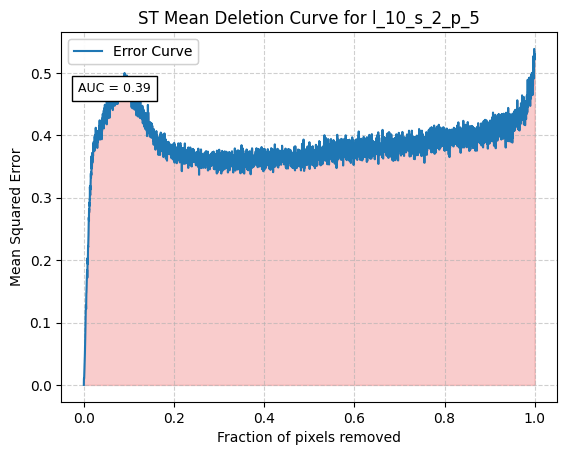

In [6]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/st_results_setup_l_10_s_2_p_5_inv_sigmoide.pkl")

# Salvataggio della lista results in un file pickle
with open(path_to_load_results, 'rb') as file:
  result_st = pickle.load(file)
  #result_st.append(setup)

all_errors_insertion = result_st["errors_insertion"]
all_errors_deletion = result_st["errors_deletion"]

nr_instance = 0

for nr_instance in range(0, len(vottignasco_test_image), 11):

  saliency_video_i = result_st["saliency_videos"][nr_instance]
  plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


parameters = result_st["parameters_comb"]

plot_mean_insertion_curve(all_errors_insertion, title=f"ST Mean Insertion Curve for {parameters}")
plot_mean_deletion_curve(all_errors_deletion,  title=f"ST Mean Deletion Curve for {parameters}")

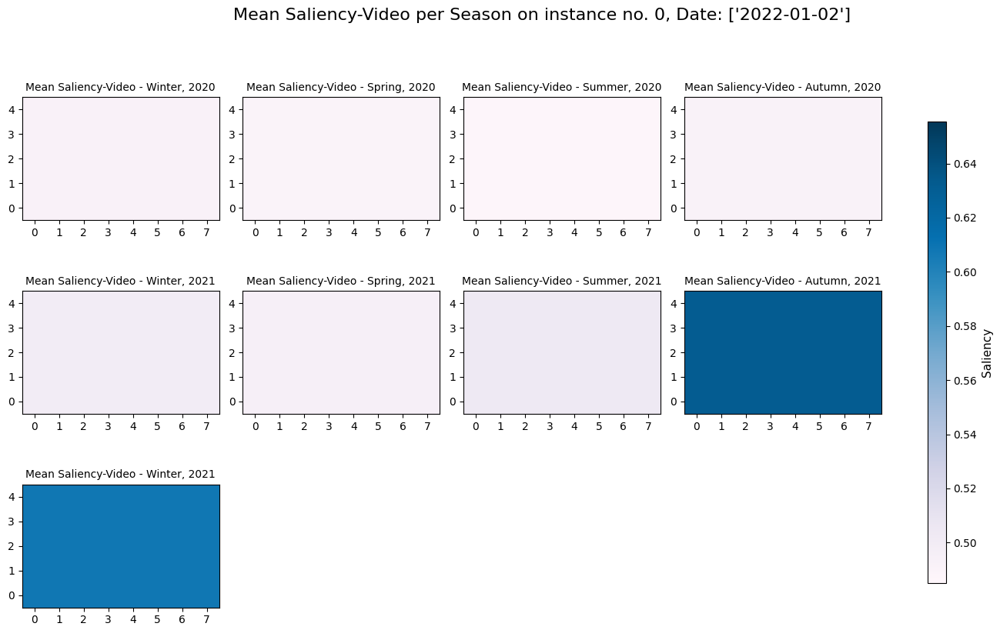

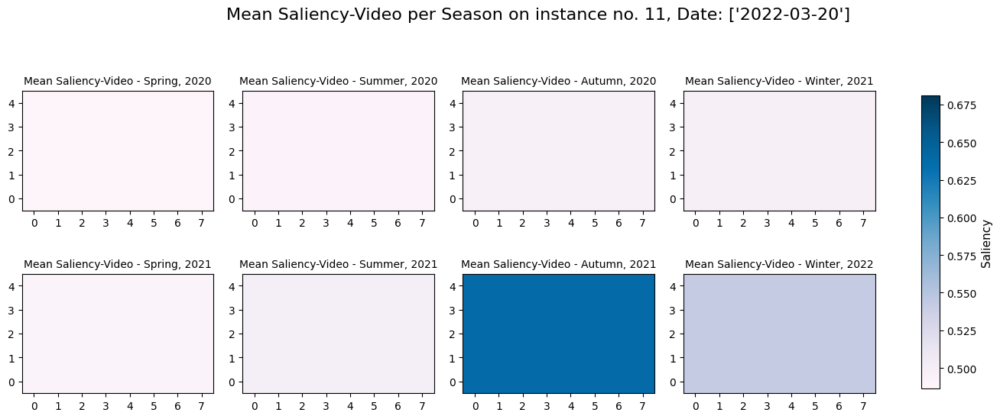

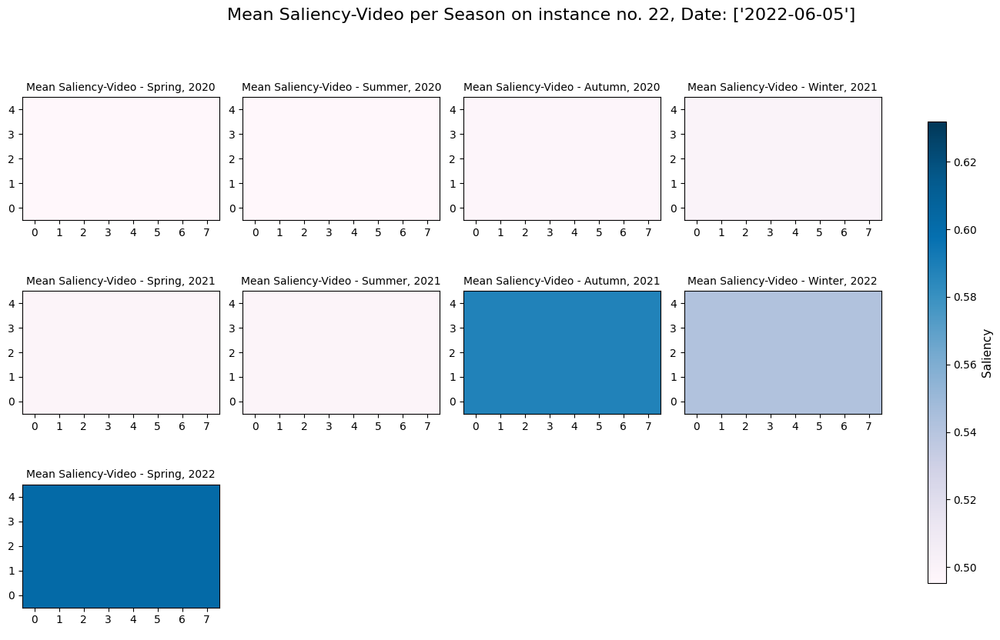

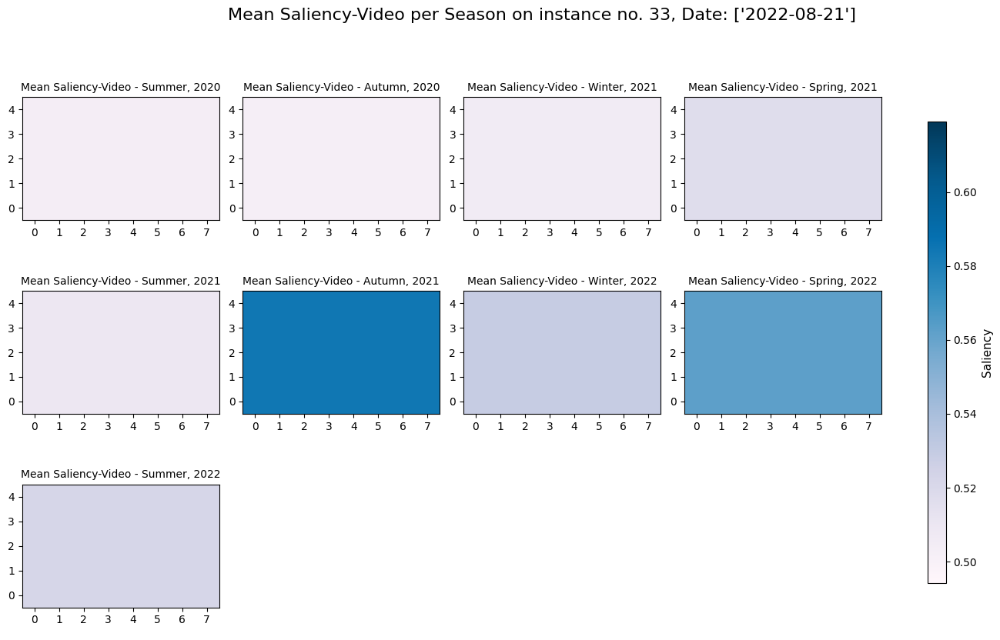

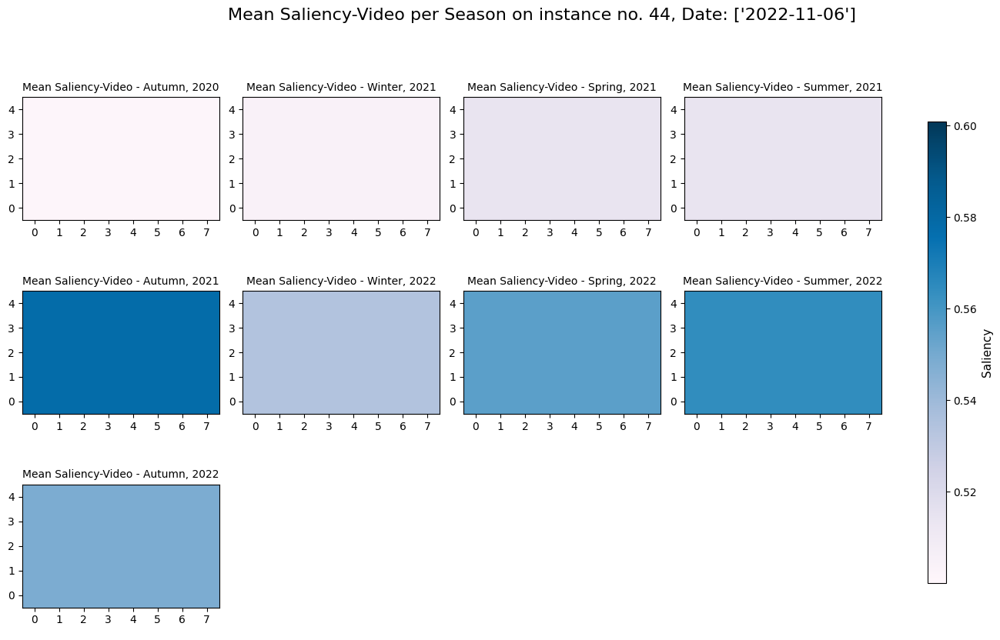

...

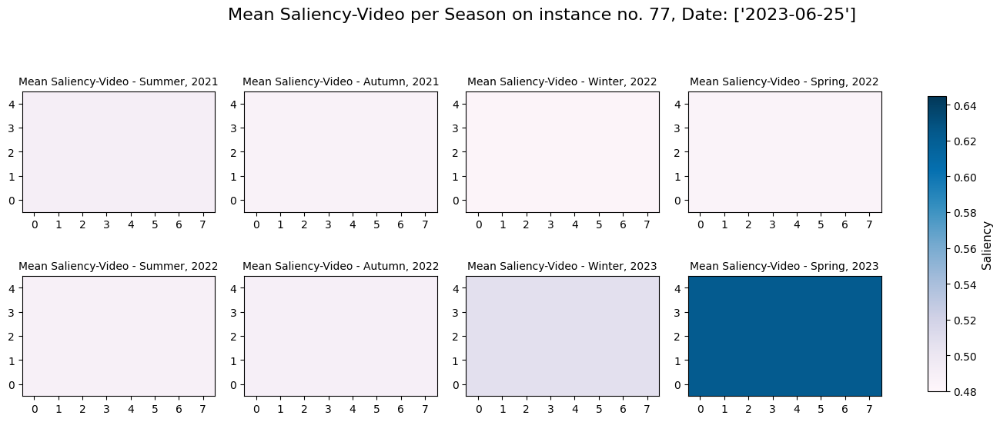

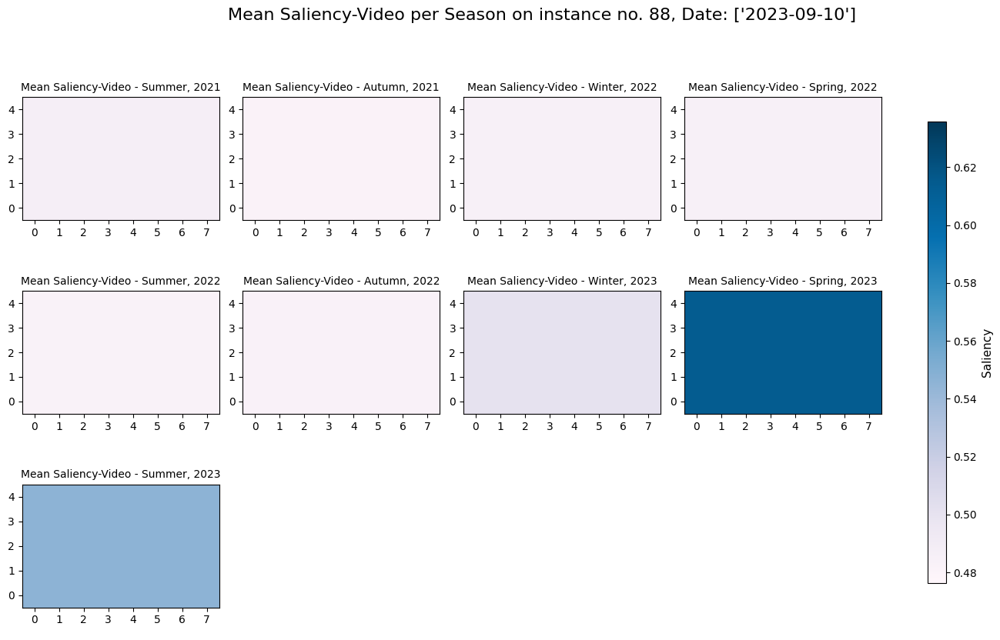

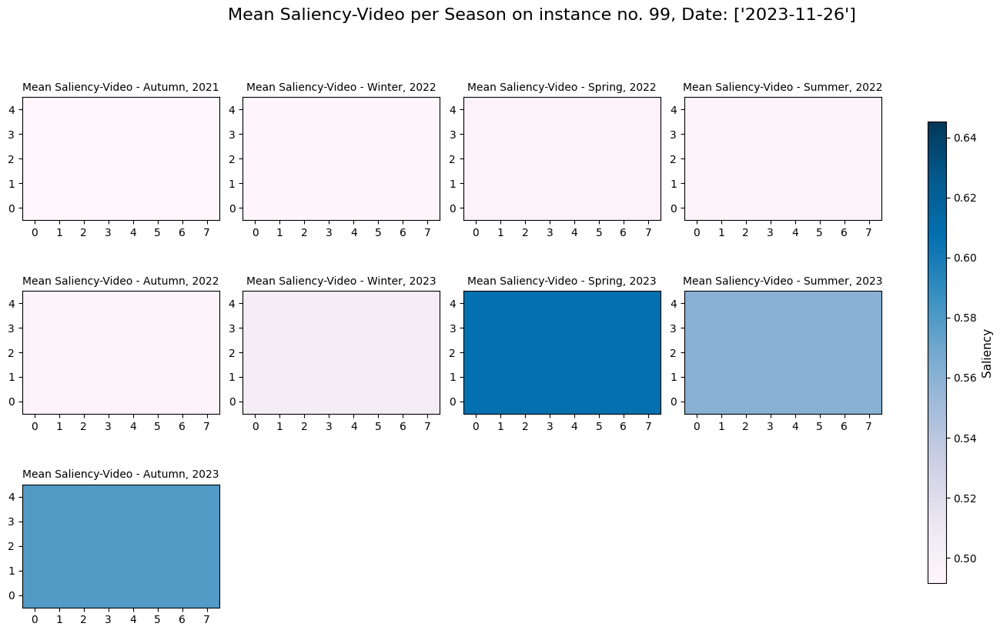

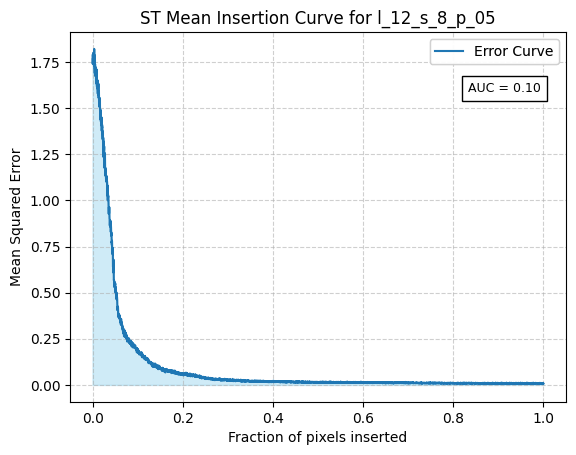

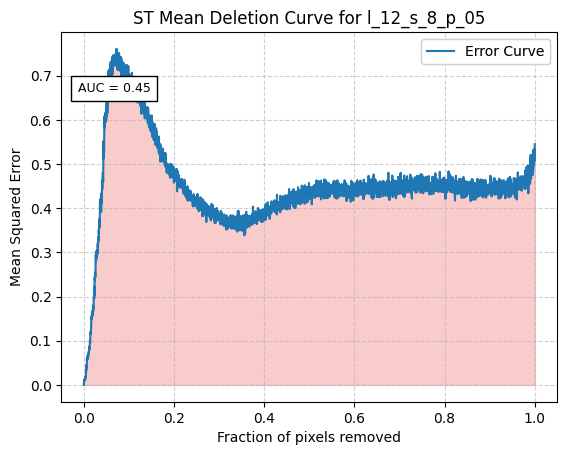

In [8]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/st_results_setup_l_12_s_8_p_05_inv_sigmoide.pkl")

# Salvataggio della lista results in un file pickle
with open(path_to_load_results, 'rb') as file:
  result_st = pickle.load(file)
  #result_st.append(setup)

all_errors_insertion = result_st["errors_insertion"]
all_errors_deletion = result_st["errors_deletion"]

nr_instance = 0

for nr_instance in range(0, len(vottignasco_test_image), 11):

  saliency_video_i = result_st["saliency_videos"][nr_instance]
  plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


parameters = result_st["parameters_comb"]

plot_mean_insertion_curve(all_errors_insertion, title=f"ST Mean Insertion Curve for {parameters}")
plot_mean_deletion_curve(all_errors_deletion,  title=f"ST Mean Deletion Curve for {parameters}")

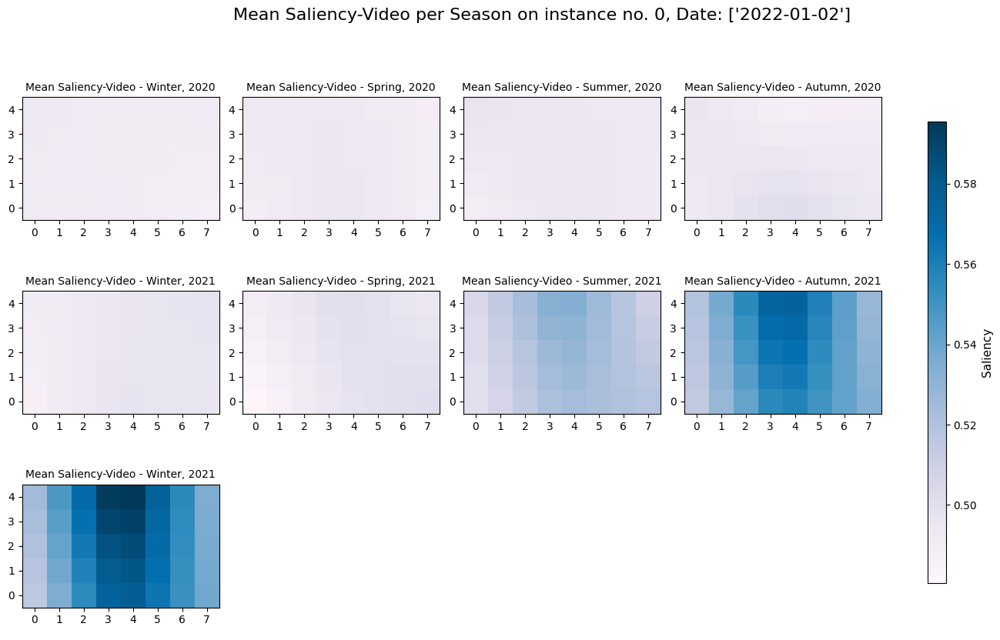

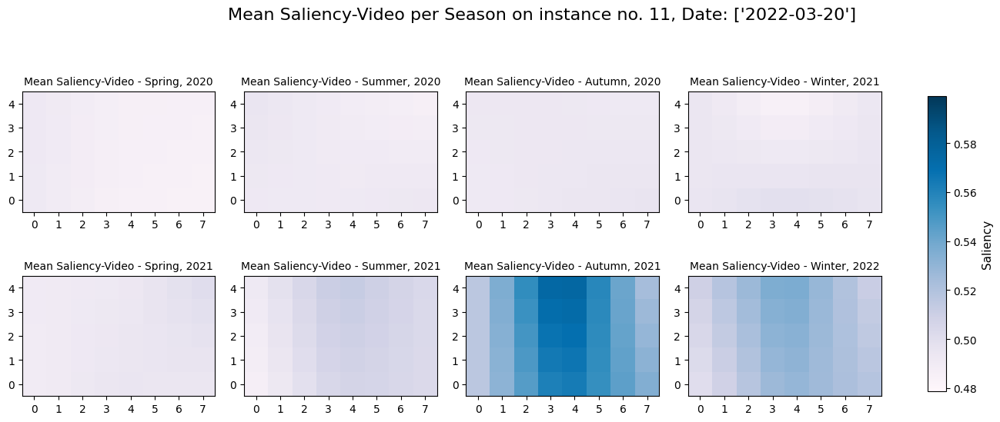

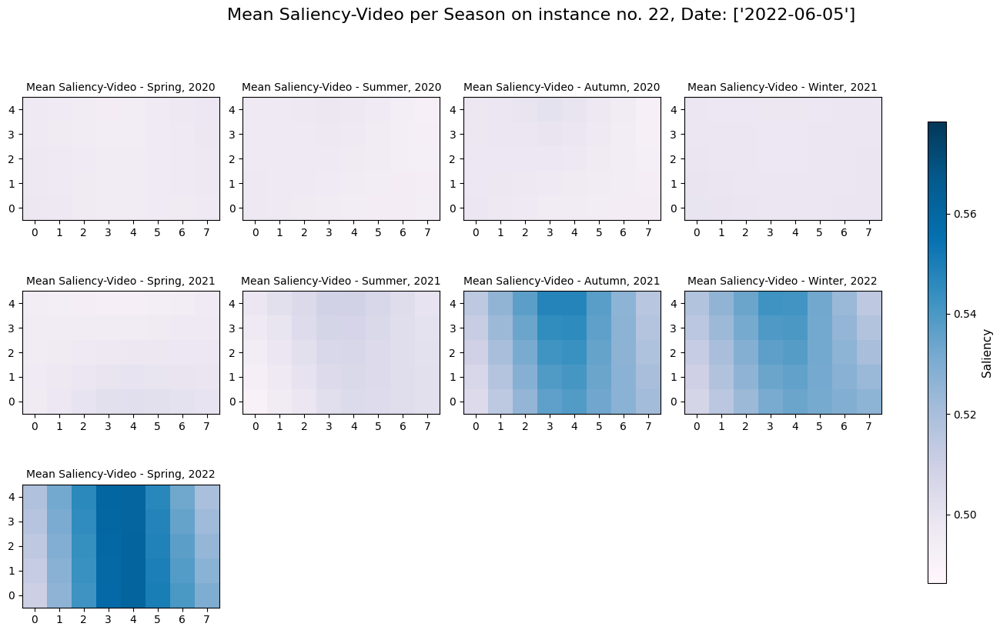

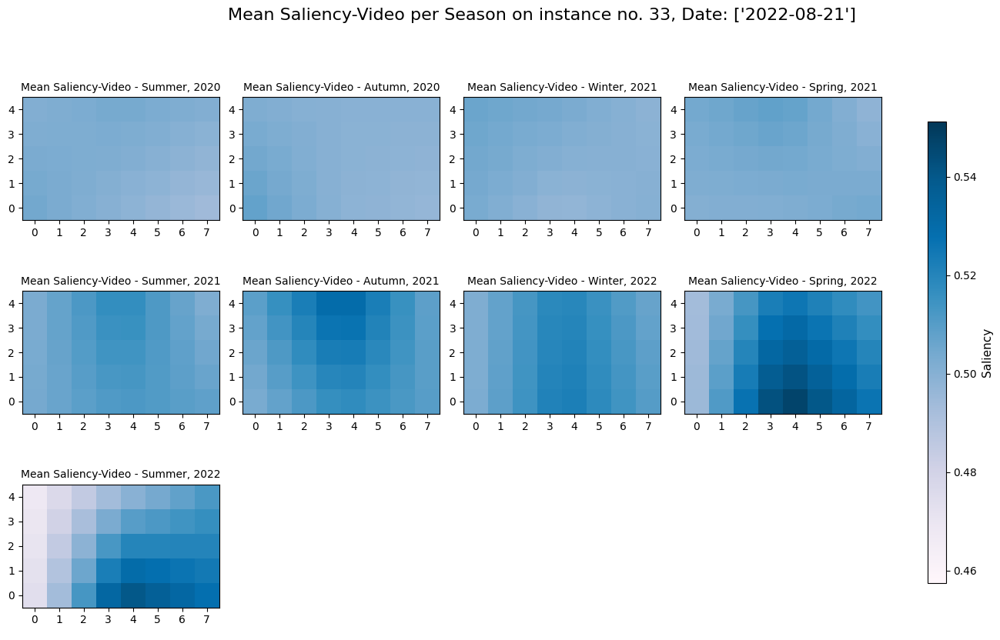

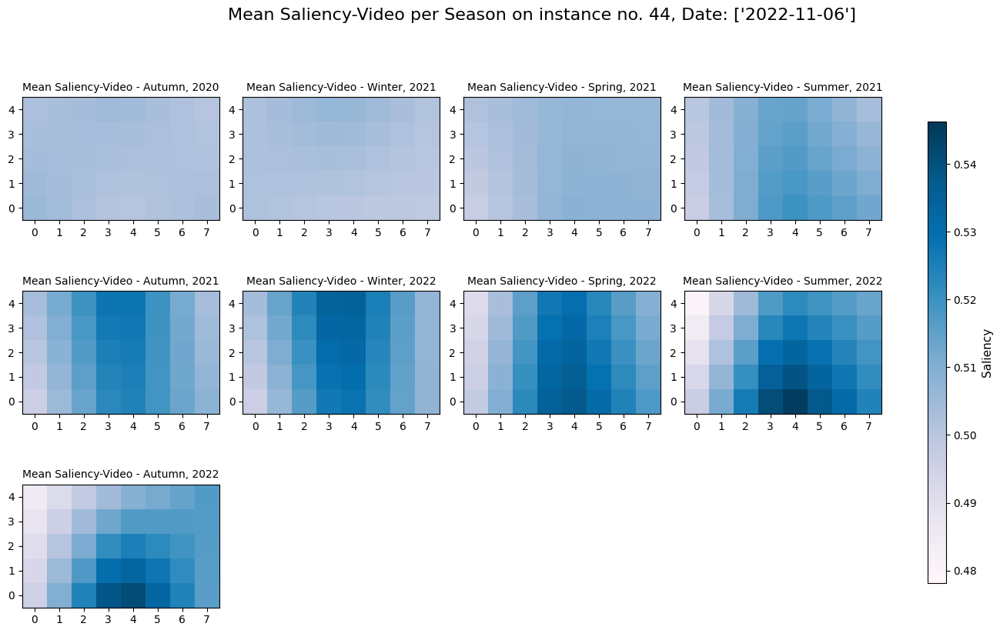

...

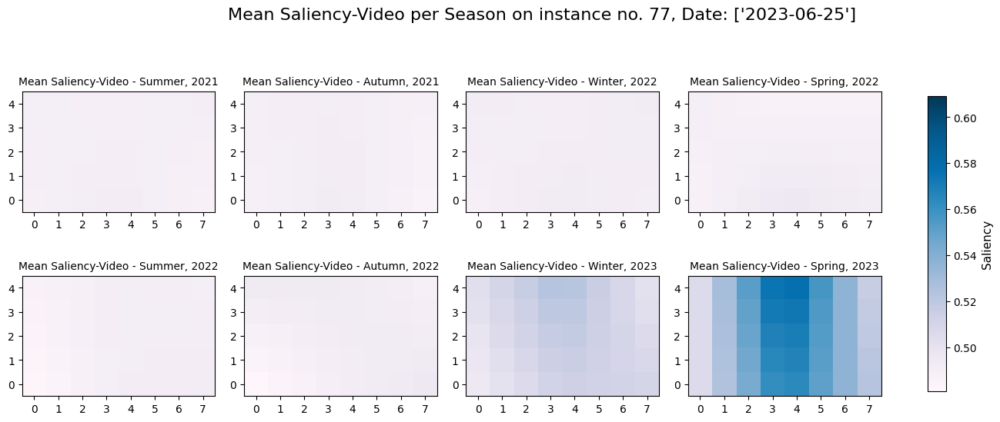

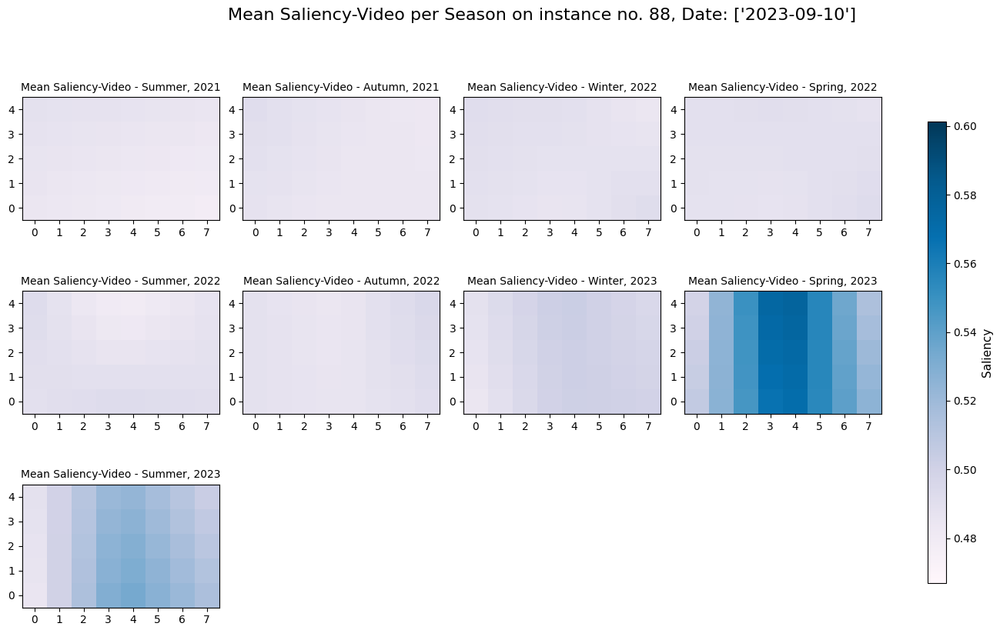

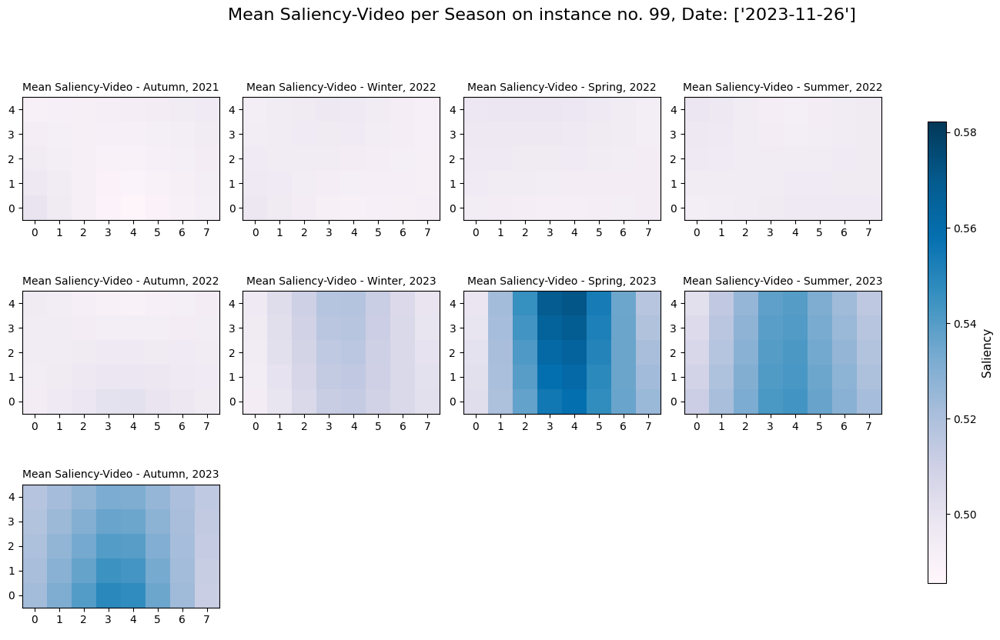

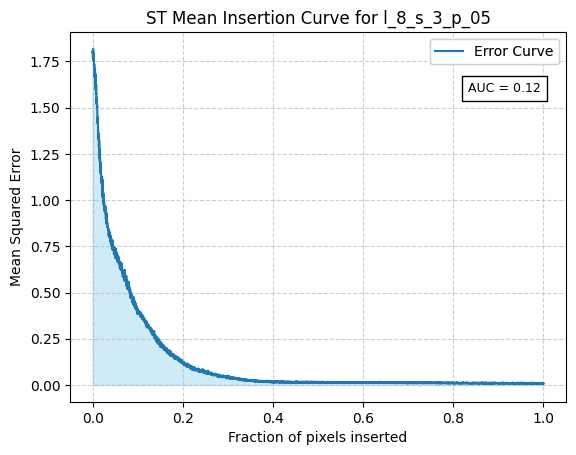

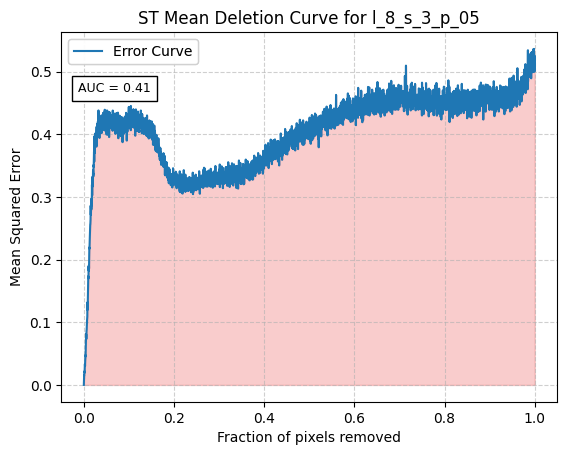

In [9]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/st_results_setup_l_8_s_3_p_05_inv_sigmoide.pkl")

# Salvataggio della lista results in un file pickle
with open(path_to_load_results, 'rb') as file:
  result_st = pickle.load(file)
  #result_st.append(setup)

all_errors_insertion = result_st["errors_insertion"]
all_errors_deletion = result_st["errors_deletion"]

nr_instance = 0

for nr_instance in range(0, len(vottignasco_test_image), 11):

  saliency_video_i = result_st["saliency_videos"][nr_instance]
  plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


parameters = result_st["parameters_comb"]

plot_mean_insertion_curve(all_errors_insertion, title=f"ST Mean Insertion Curve for {parameters}")
plot_mean_deletion_curve(all_errors_deletion,  title=f"ST Mean Deletion Curve for {parameters}")

In [32]:
import numpy as np
import matplotlib.pyplot as plt

def plot_combined_curves(all_errors_insertion, all_errors_deletion, parameter_combinations, save_path=""):
    # Creazione della figura e dei due subplot (1 riga, 2 colonne)
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # # Plot per la curva di inserimento
    # max_len_insertion = max(map(len, all_errors_insertion))
    # padded_array_insertion = np.full((len(all_errors_insertion), max_len_insertion), np.nan)
    # for i, row in enumerate(all_errors_insertion):
    #     padded_array_insertion[i, :len(row)] = row  # Riempie solo le parti esistenti
    mean_errors_for_insertion_vott = np.nanmean(all_errors_insertion, axis=0)

    #x_insertion = np.arange(0, mean_errors_for_insertion_vott.shape[0])
    x_insertion = np.linspace(0, 1, mean_errors_for_insertion_vott.shape[0])
    auc_insertion = calculate_auc(x_insertion, mean_errors_for_insertion_vott)
    auc_text_insertion = f'AUC = {auc_insertion:.2f}'
    axs[0].plot(x_insertion, mean_errors_for_insertion_vott, label=f'Error Curve, {auc_text_insertion}')
    #axs[0].scatter(x_insertion, mean_errors_for_insertion_vott, color='blue', zorder=3)    
    

    axs[0].fill_between(x_insertion, mean_errors_for_insertion_vott, color='skyblue', alpha=0.4)
    axs[0].set_xlabel('Fraction of pixels inserted')
    axs[0].set_ylabel('Mean Squared Error')
    axs[0].grid(True, linestyle='--', alpha=0.6)
    axs[0].set_title('Mean Temporal Insertion Metric Curve')
    axs[0].legend()

    # # Plot per la curva di cancellazione
    # max_len_deletion = max(map(len, all_errors_deletion))
    # padded_array_deletion = np.full((len(all_errors_deletion), max_len_deletion), np.nan)
    # for i, row in enumerate(all_errors_deletion):
    #     padded_array_deletion[i, :len(row)] = row  # Riempie solo le parti esistenti
    # mean_errors_for_deletion_vott = np.nanmean(padded_array_deletion, axis=0)
    mean_errors_for_deletion_vott = np.nanmean(all_errors_deletion, axis=0)

    #x_deletion = np.arange(0, mean_errors_for_deletion_vott.shape[0])
    x_deletion = np.linspace(0, 1, mean_errors_for_deletion_vott.shape[0])
    auc_deletion = calculate_auc(x_deletion, mean_errors_for_deletion_vott)
    auc_text_deletion = f'AUC = {auc_deletion:.2f}'
    
    axs[1].plot(x_deletion, mean_errors_for_deletion_vott, label=f'Error Curve, {auc_text_deletion}')
    #axs[1].scatter(x_deletion, mean_errors_for_deletion_vott, color='red', zorder=3)
    axs[1].fill_between(x_deletion, mean_errors_for_deletion_vott, color='lightcoral', alpha=0.4)
    axs[1].set_xlabel('Fraction of pixels removed')
    axs[1].set_ylabel('Mean Squared Error')
    axs[1].grid(True, linestyle='--', alpha=0.6)
    axs[1].set_title('Deletion Mean Metric Curve')
    axs[1].legend()

    # Aggiungi il titolo globale
    plt.suptitle(f"Mean Insertion and Deletion Error Curves for RISE Spatio_Temporal: {parameter_combinations}", fontsize=16)
    # Mostra i plot
    plt.tight_layout()

    # Salva la figura con DPI 400
    #plt.tight_layout()
    #plt.subplots_adjust(top=0.85)  # Per evitare che il titolo si sovrapponga ai grafici
    #plt.savefig(save_path, dpi=400)

    plt.show()


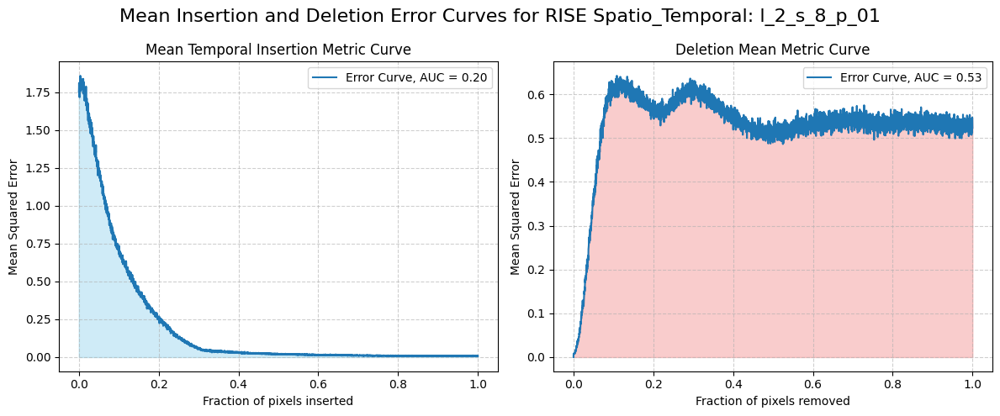

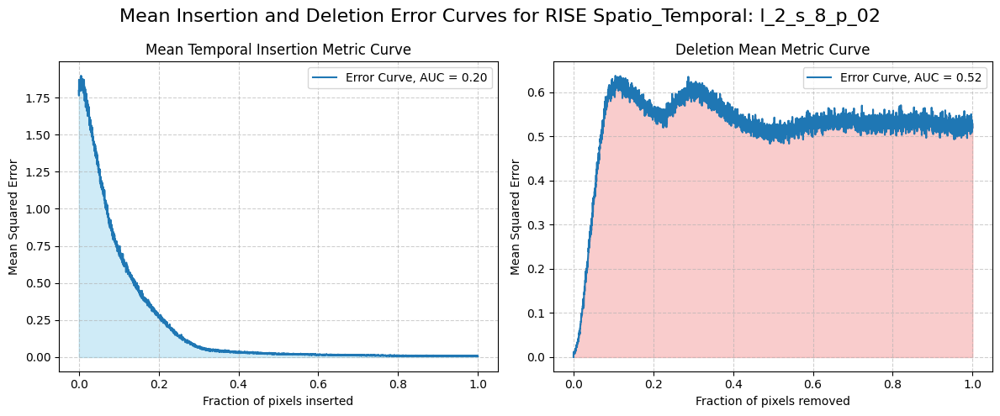

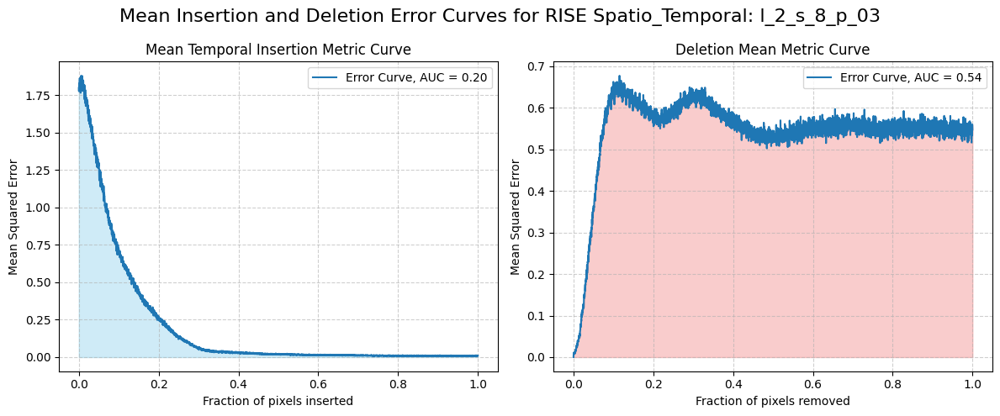

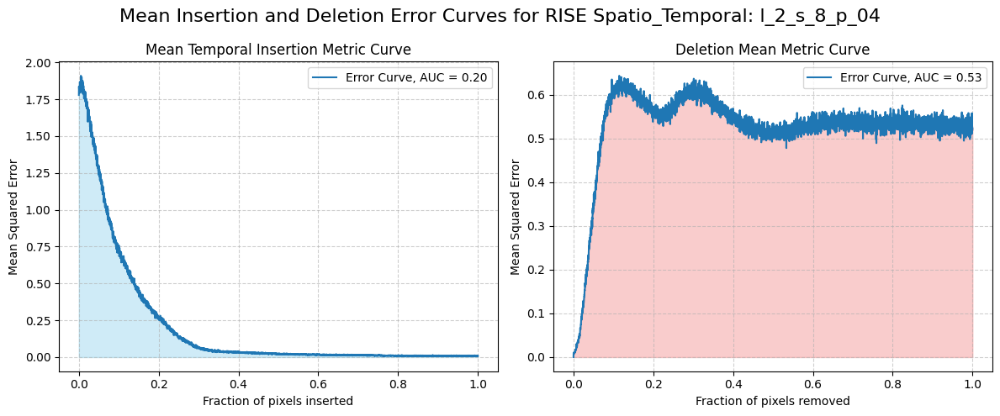

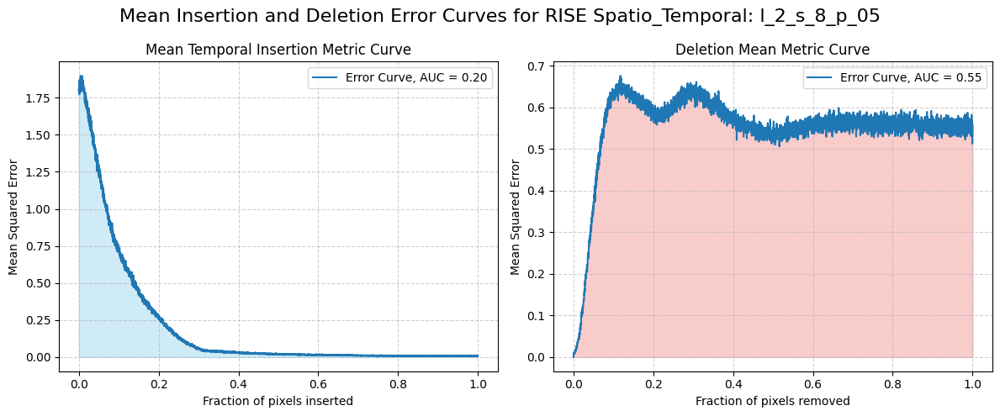

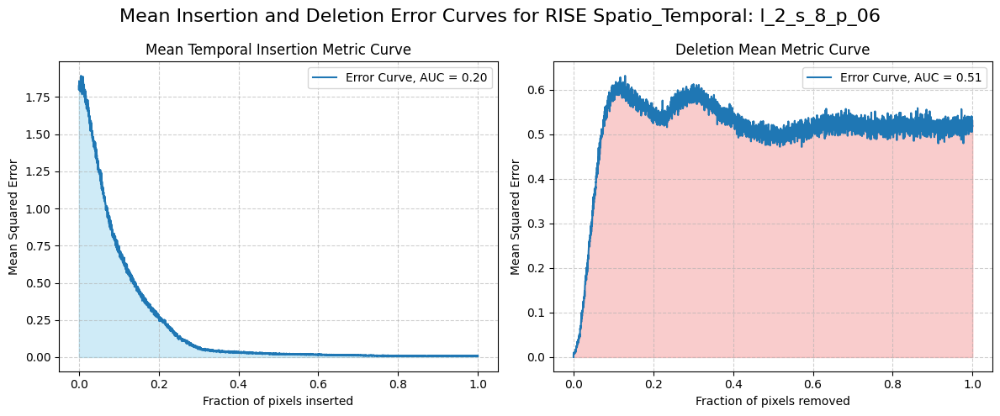

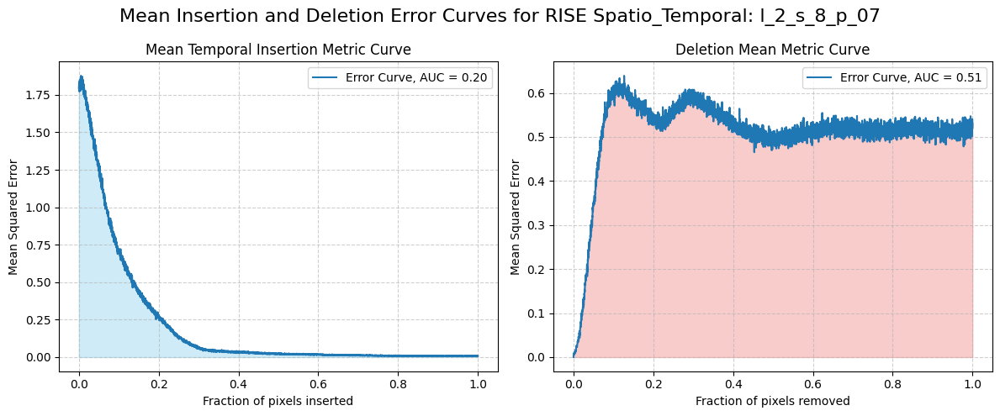

In [34]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 2
s = 8
p_values = [1,2,3,4,5,6,7]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_0{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

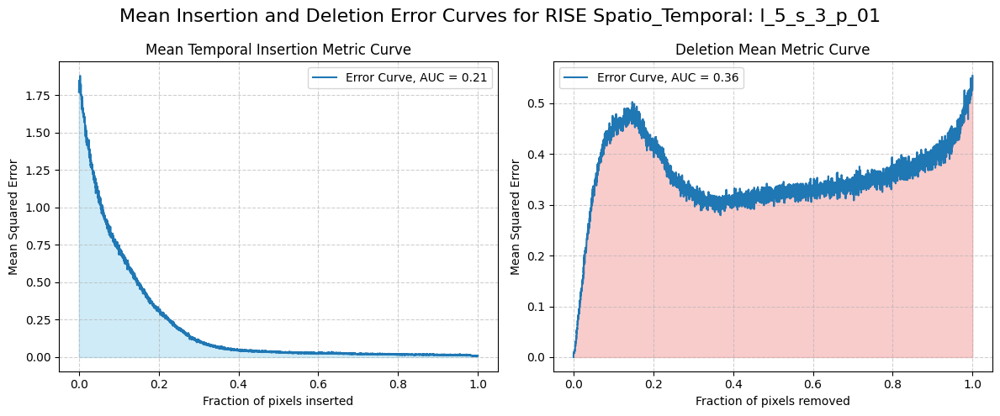

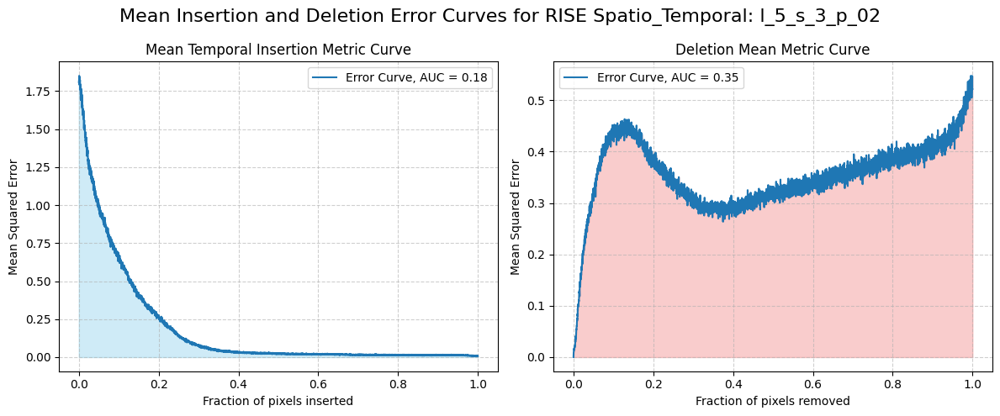

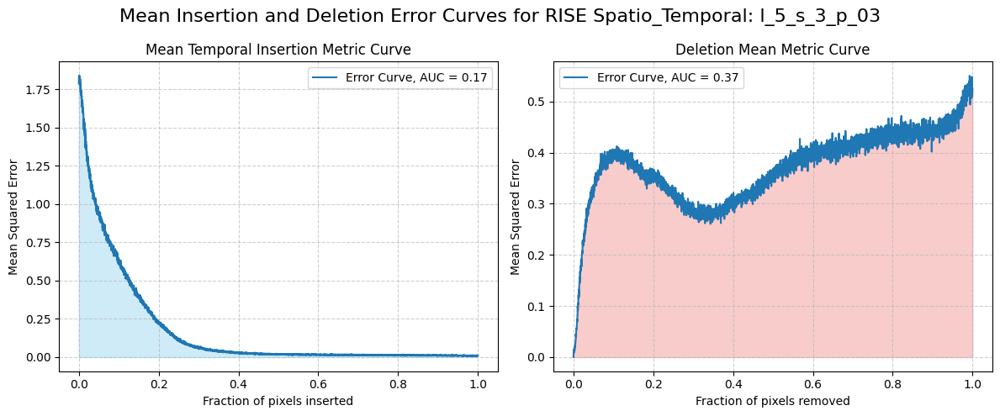

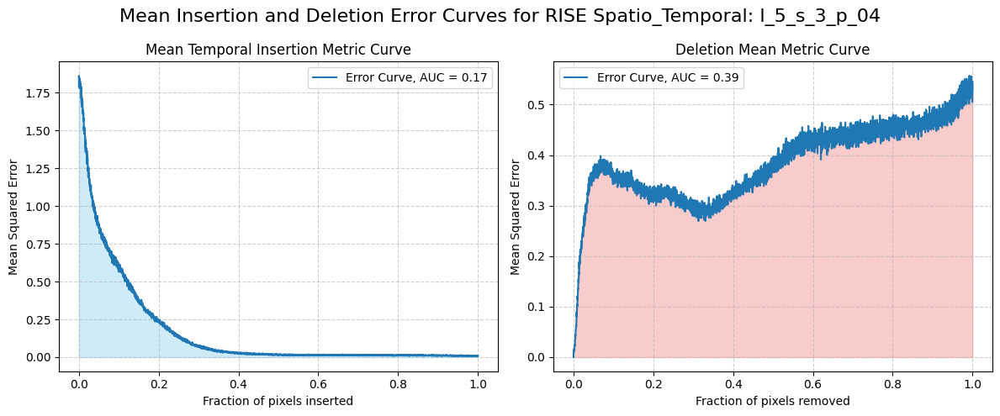

In [35]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 5
s = 3
p_values = [1,2,3,4]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_0{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

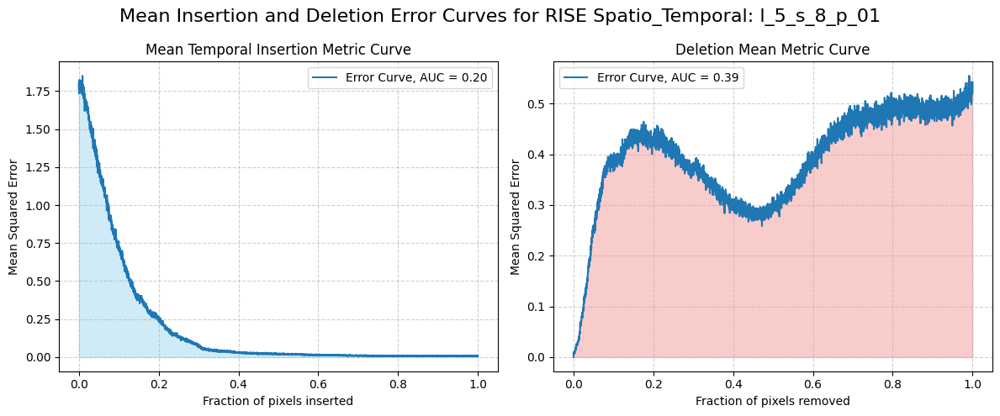

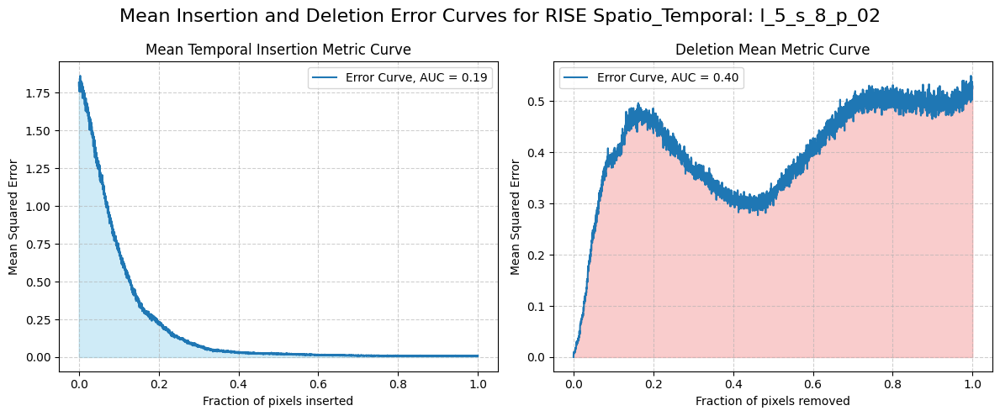

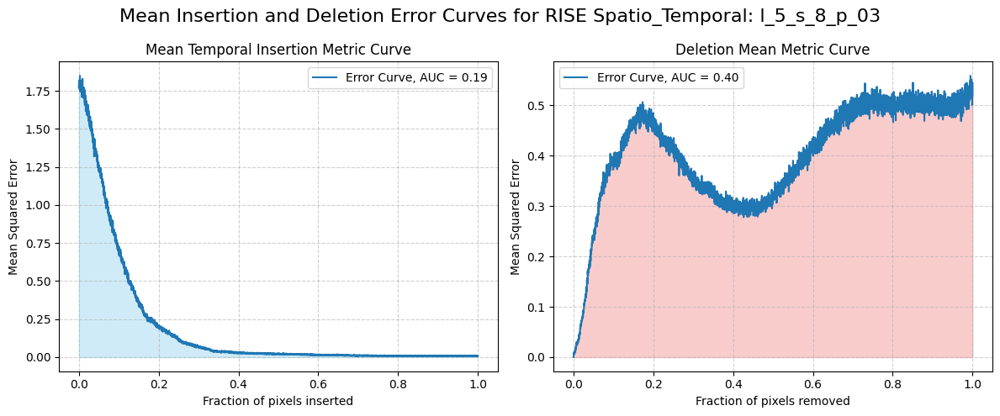

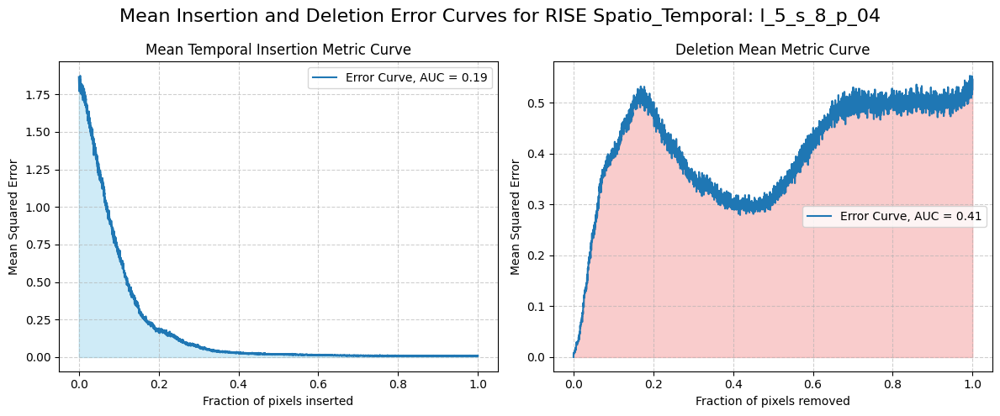

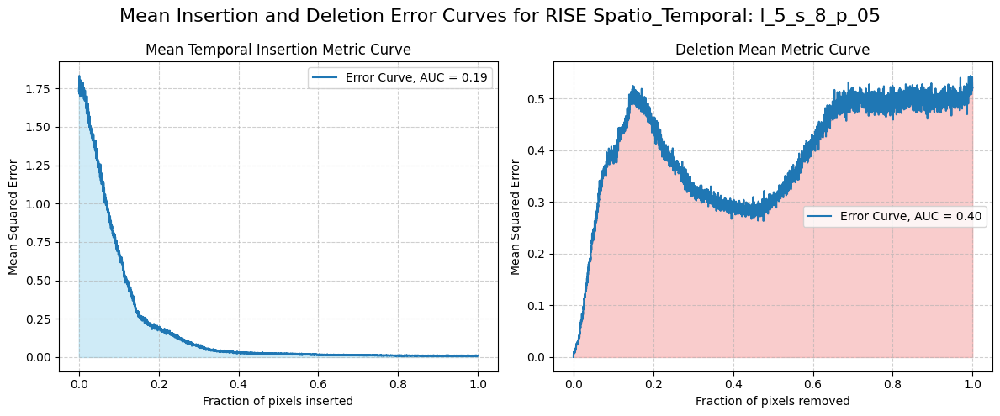

In [36]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 5
s = 8
p_values = [1,2,3,4,5]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_0{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

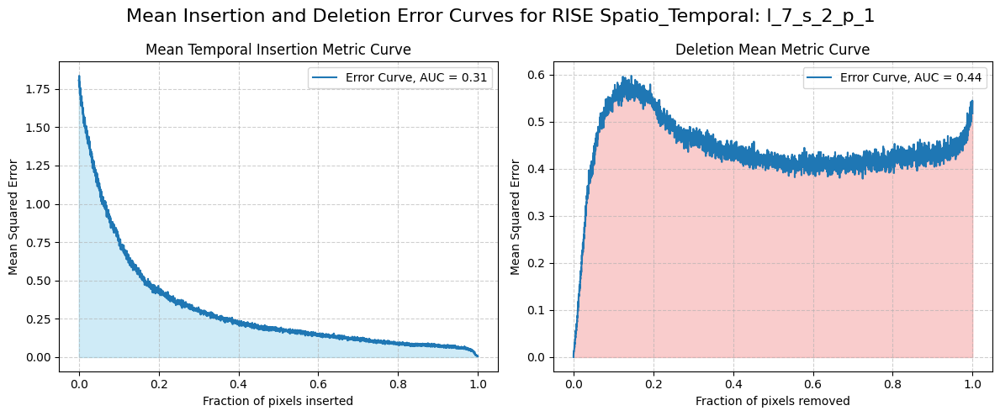

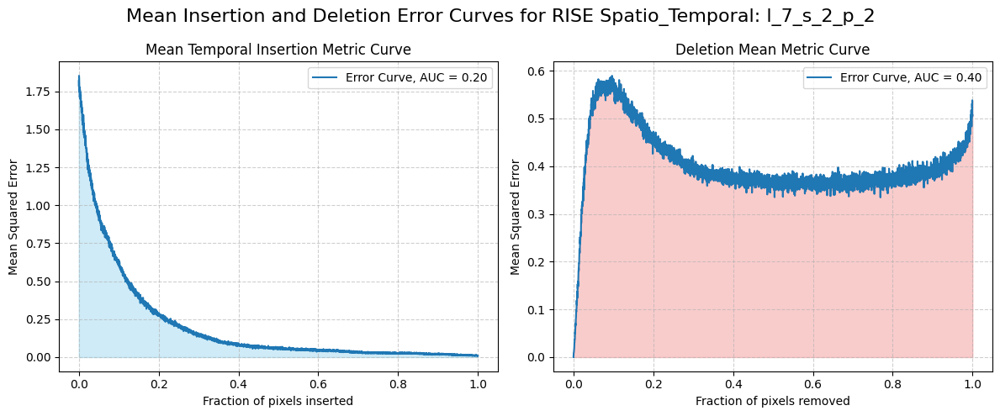

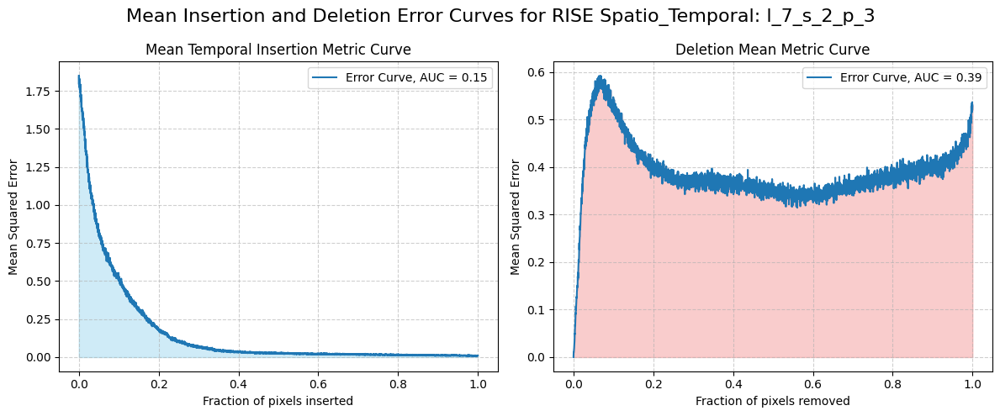

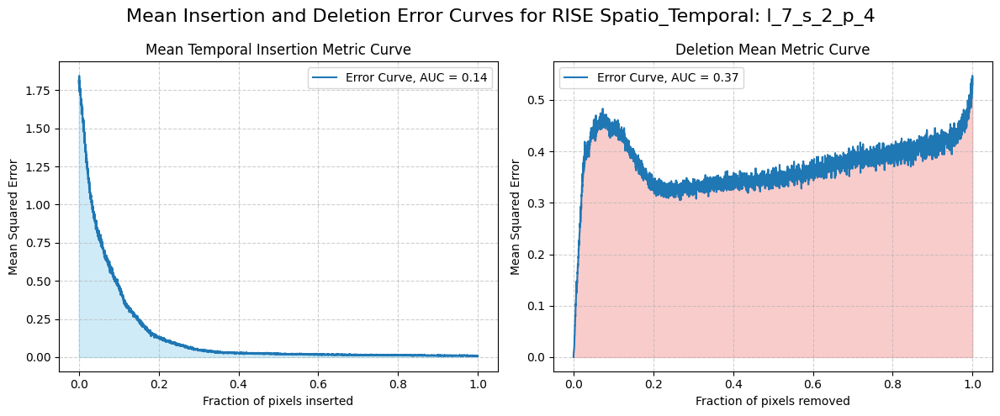

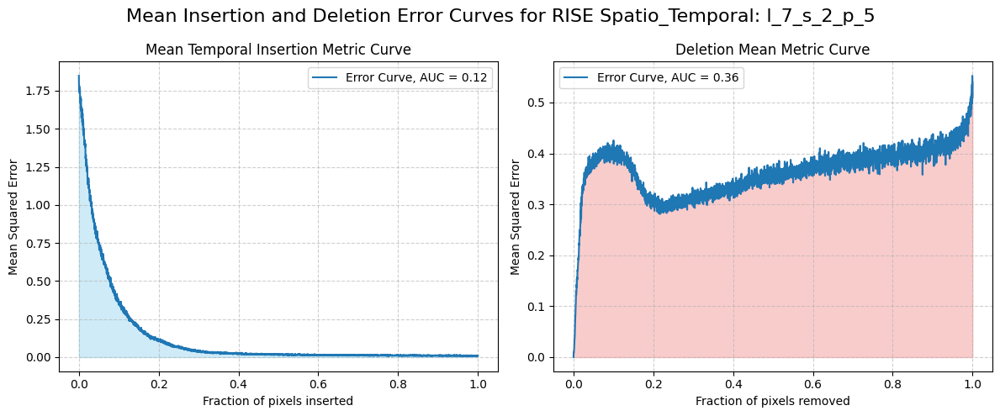

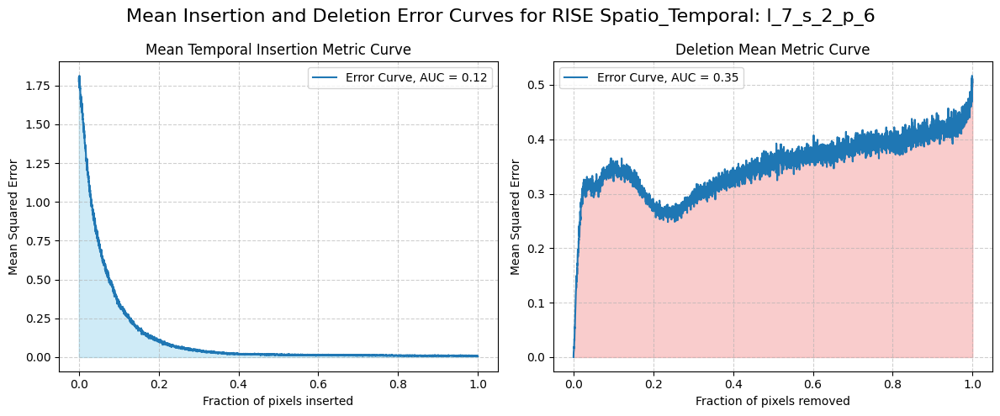

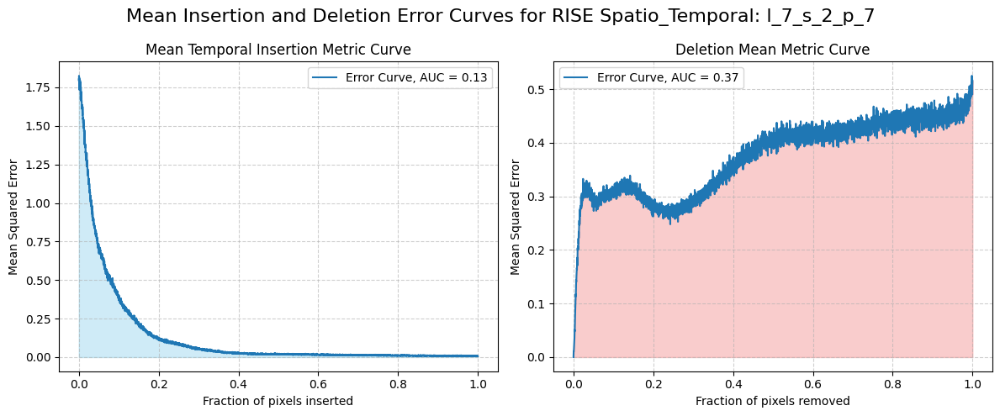

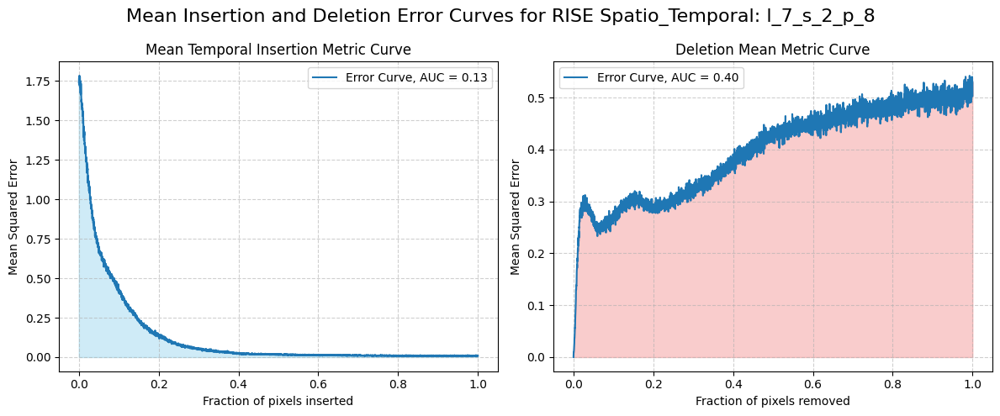

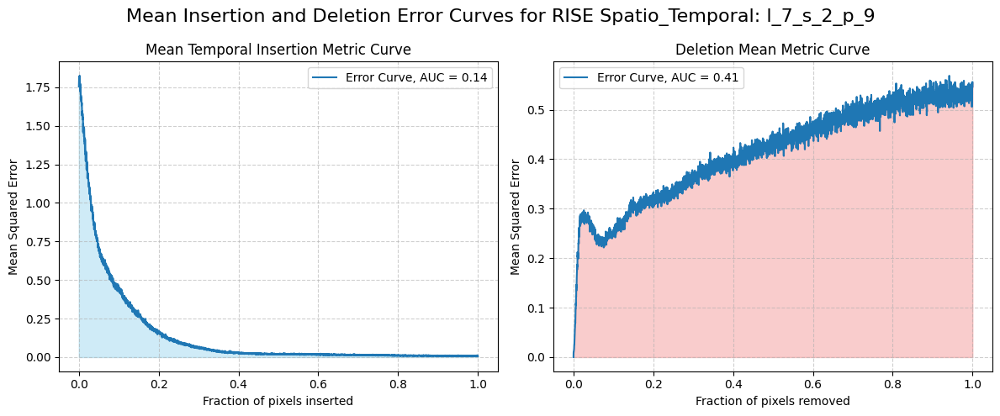

In [37]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 7
s = 2
p_values = [1,2,3,4,5,6,7,8,9]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

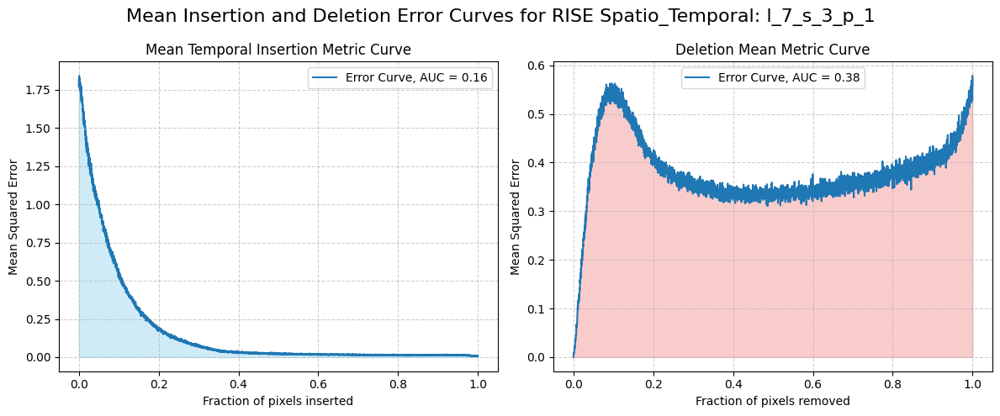

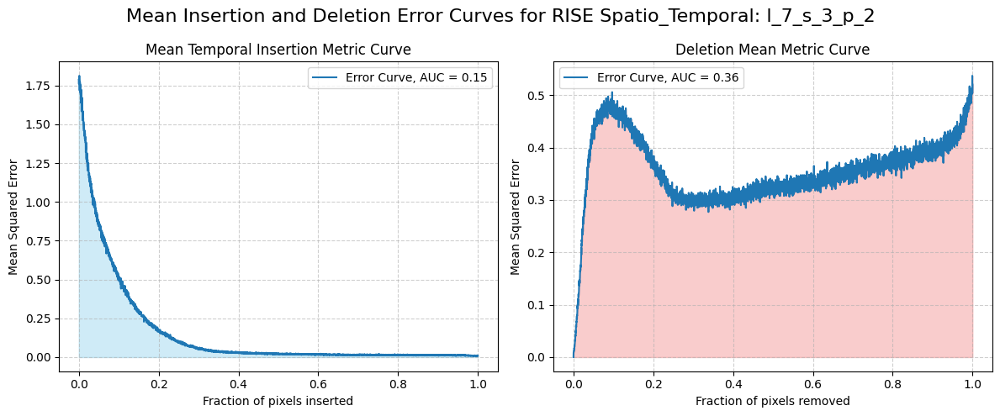

In [40]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 7
s = 3
p_values = [1,2]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

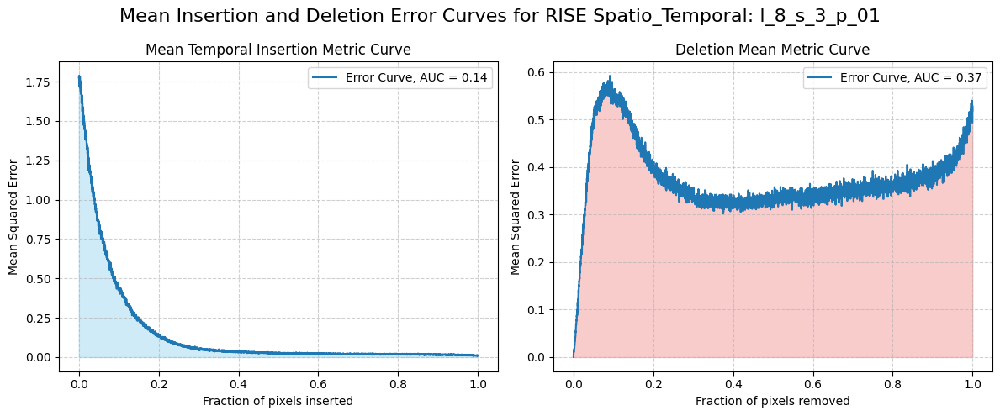

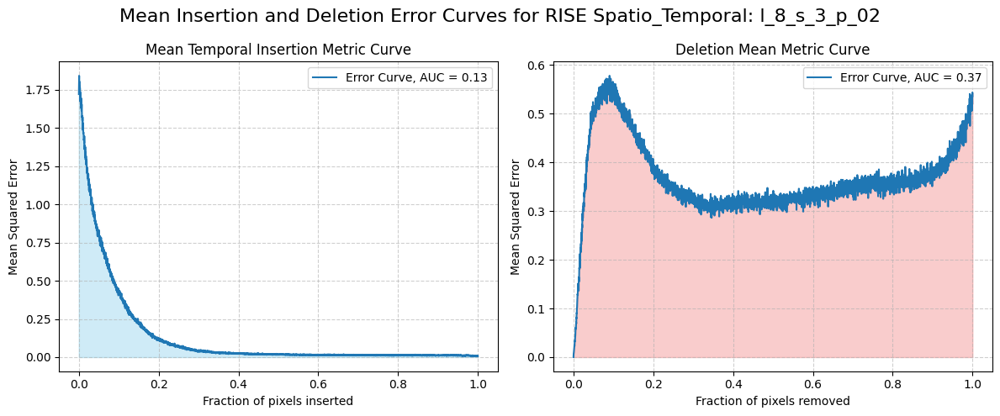

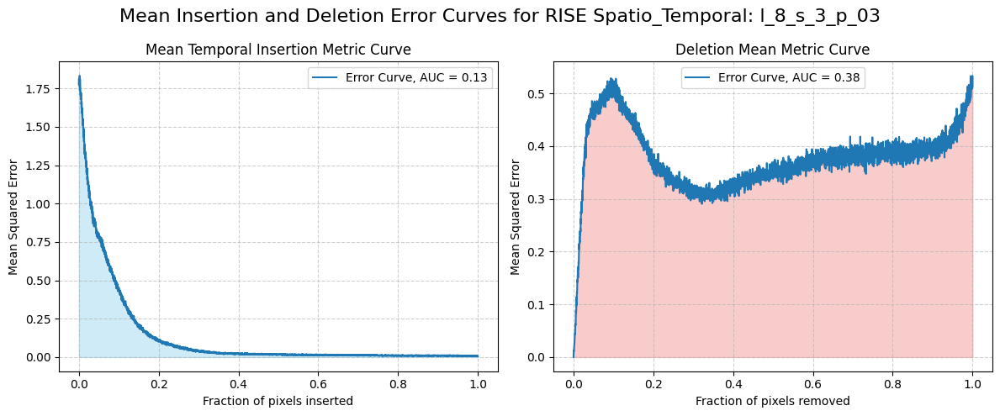

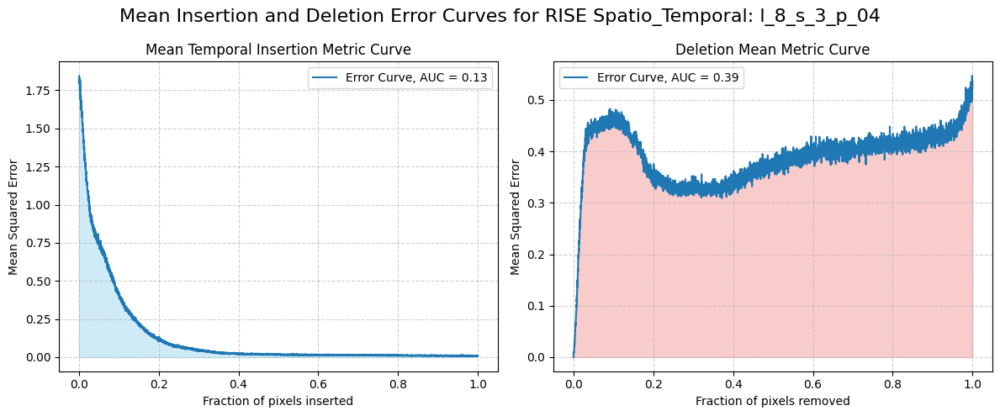

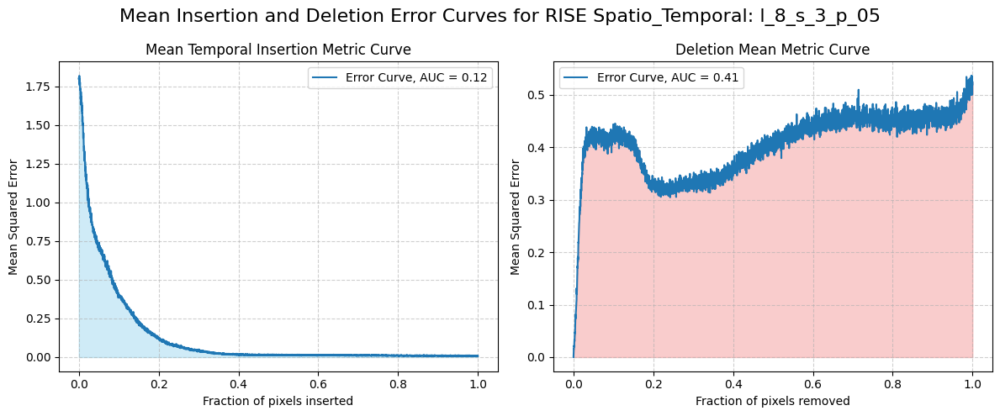

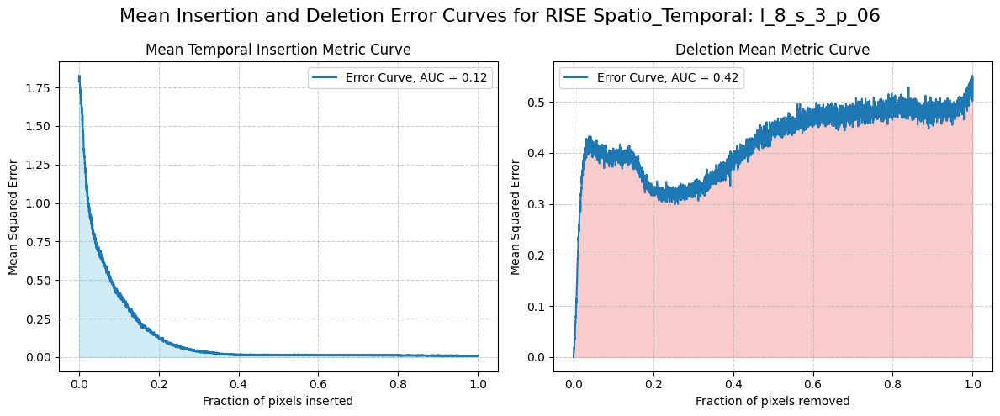

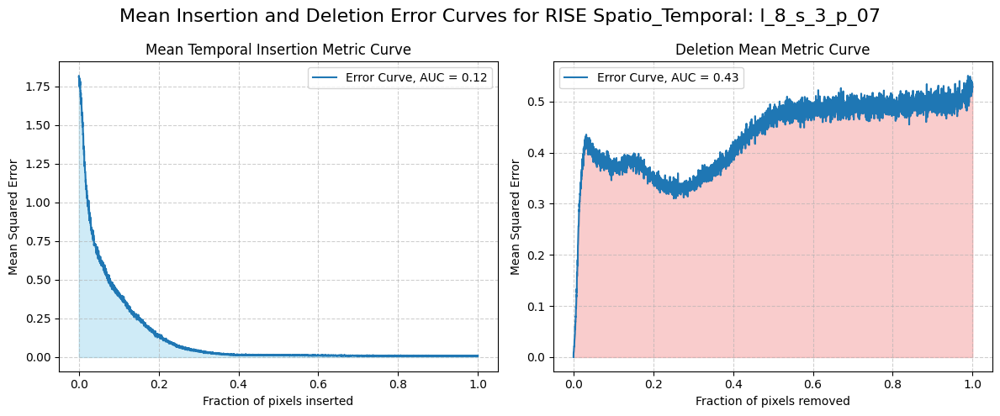

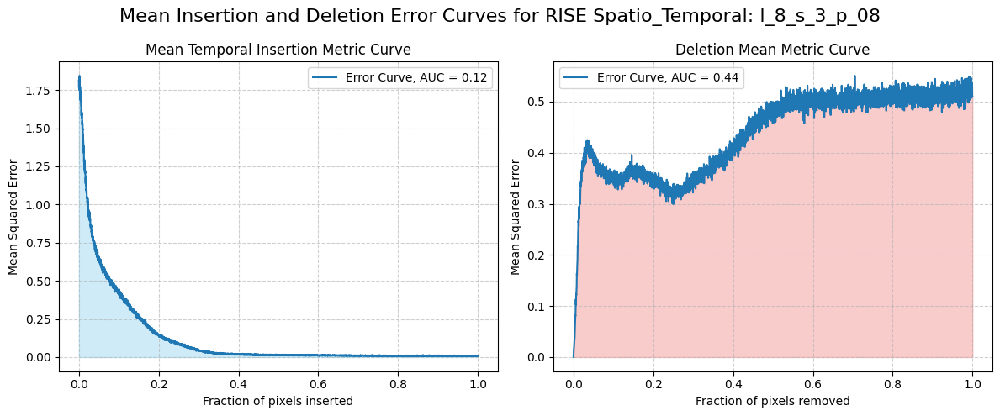

In [41]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 8
s = 3
p_values = [1,2,3,4,5,6,7,8]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_0{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

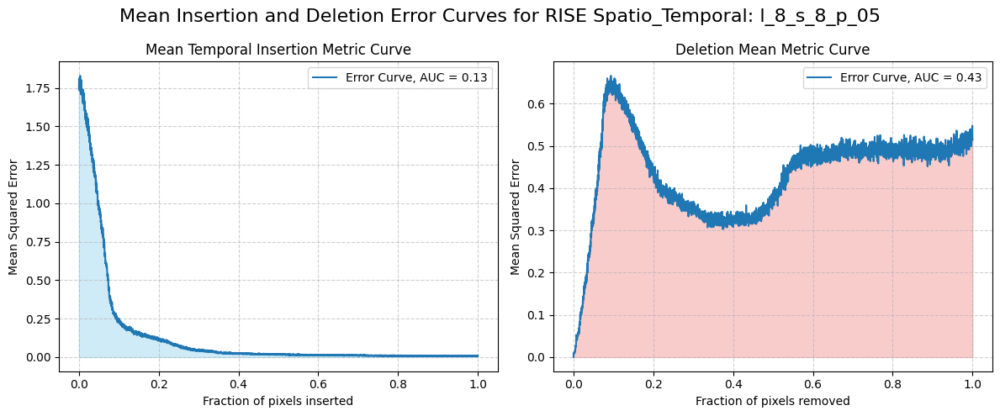

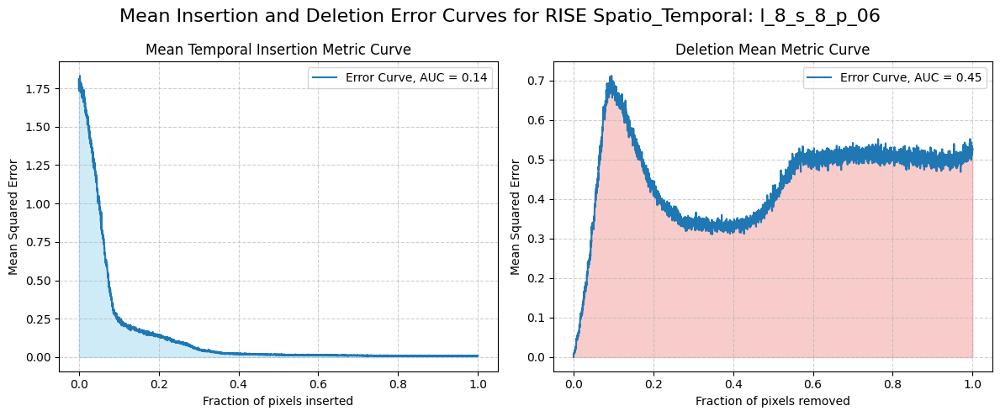

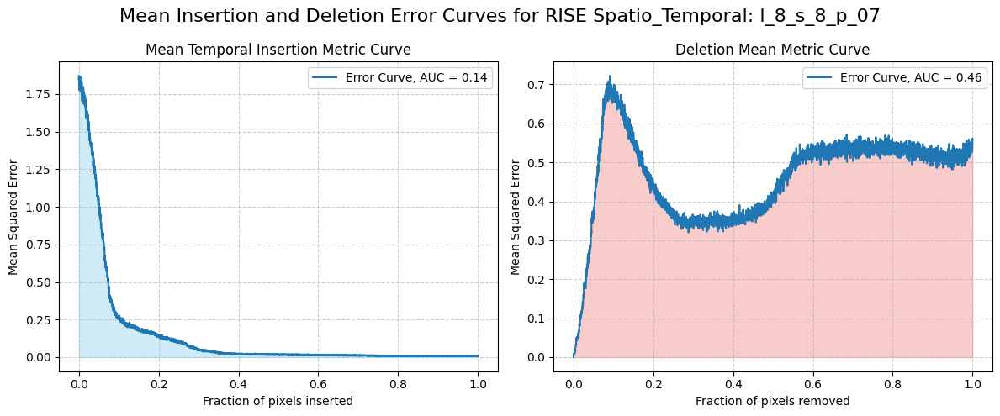

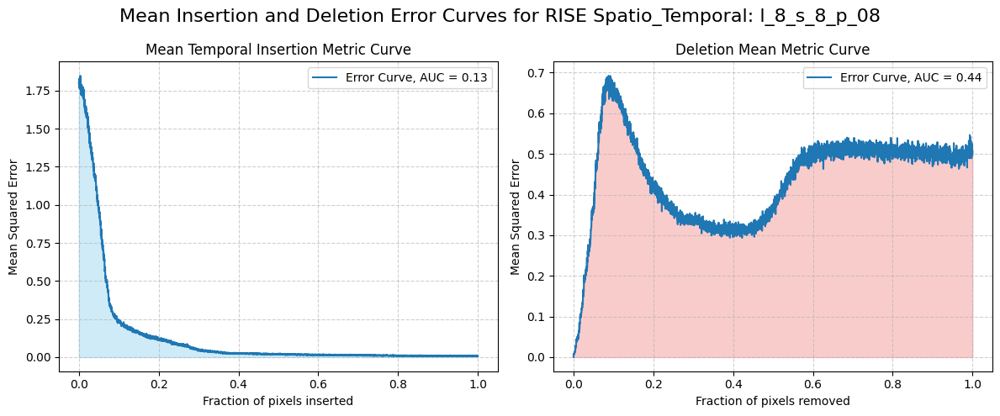

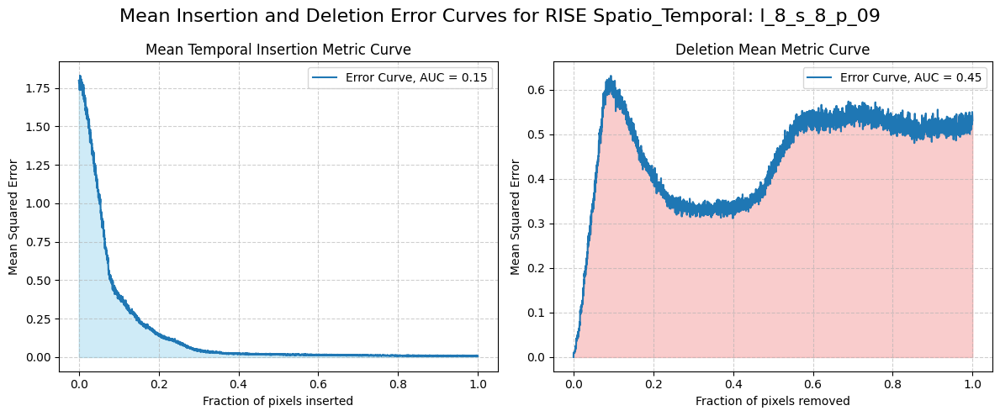

In [42]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 8
s = 8
p_values = [5,6,7,8,9]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_0{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

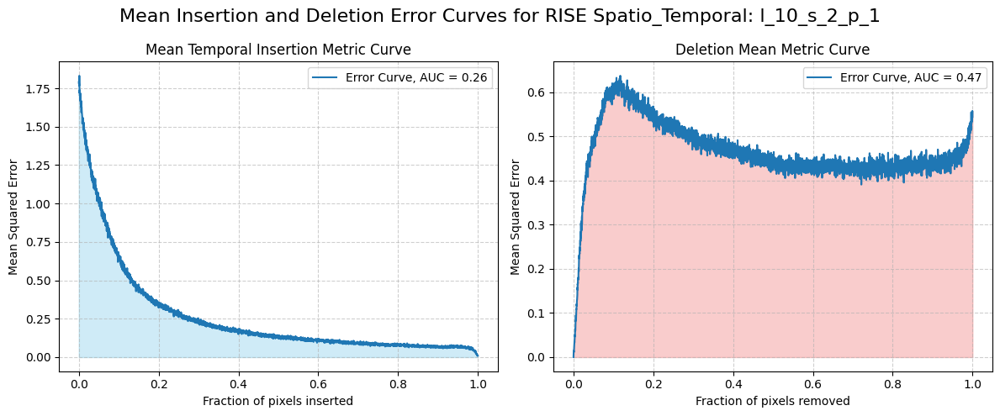

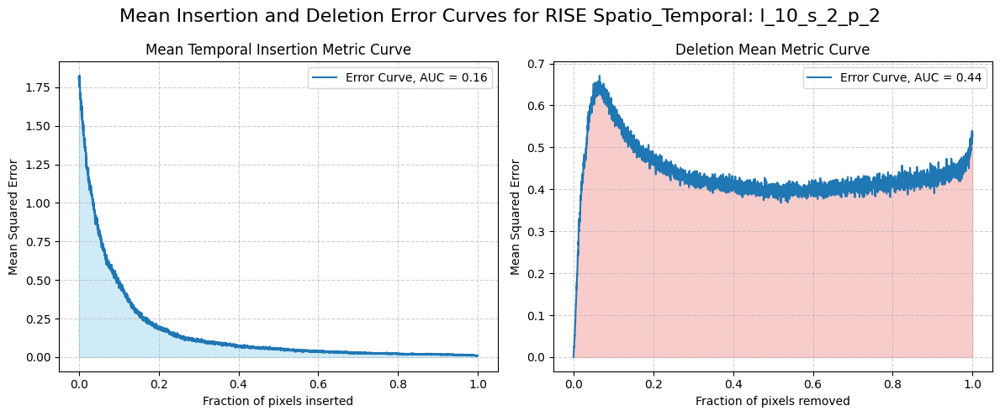

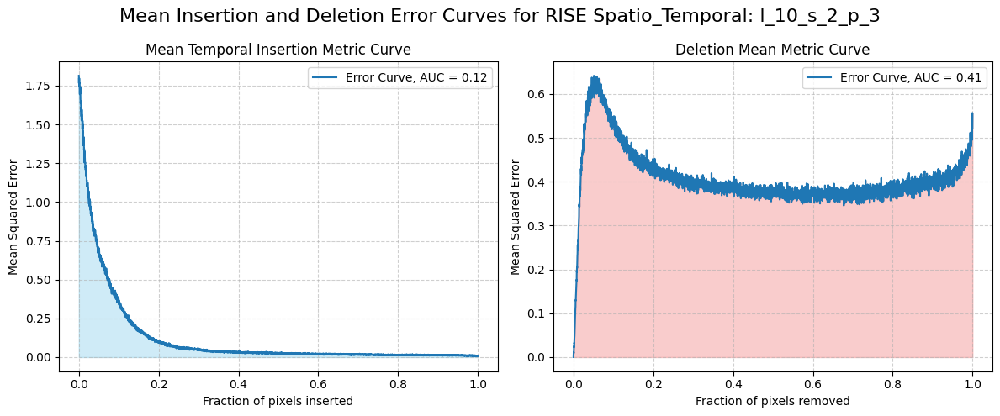

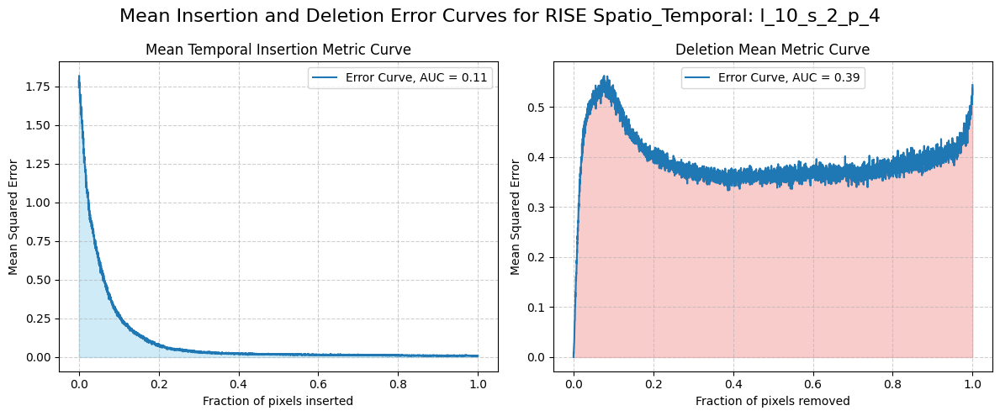

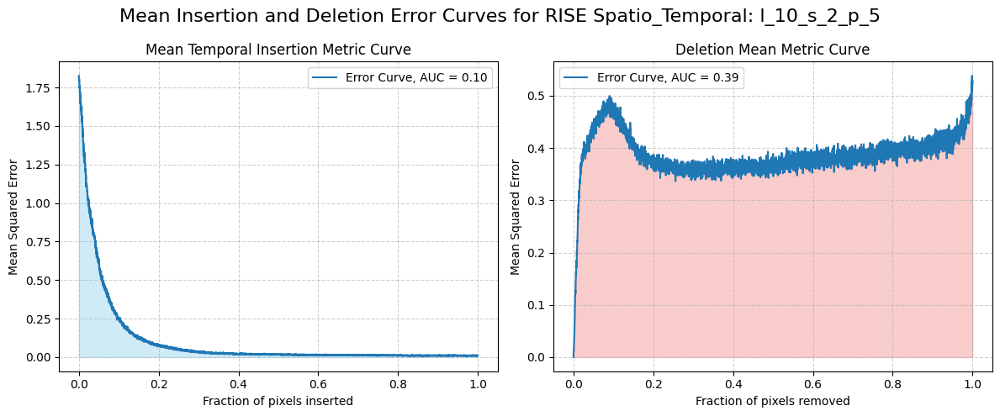

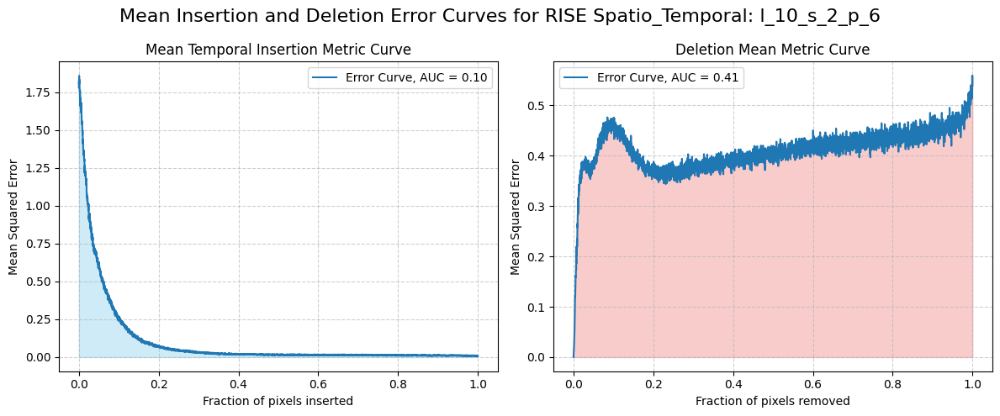

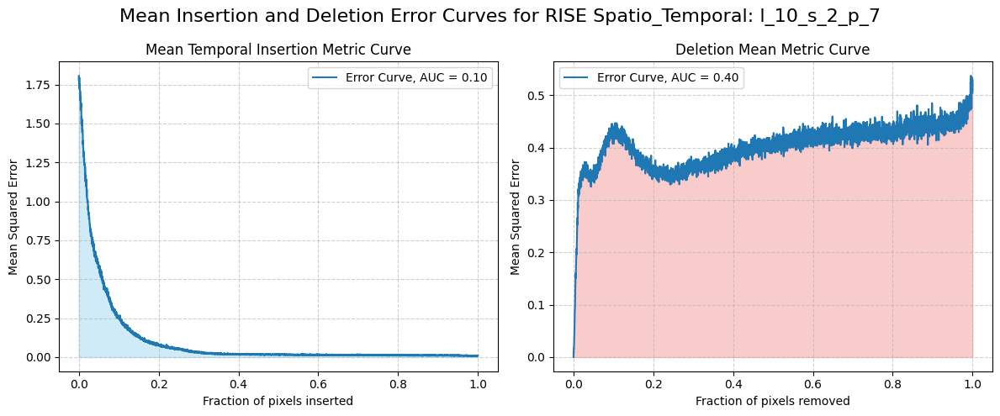

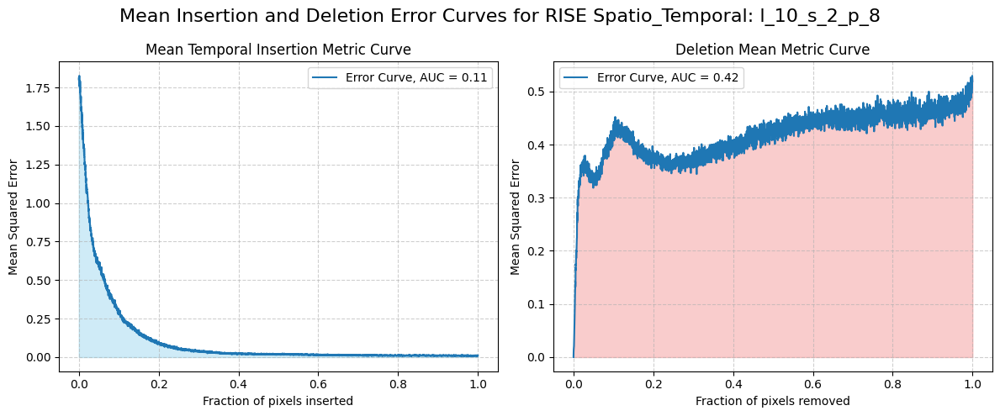

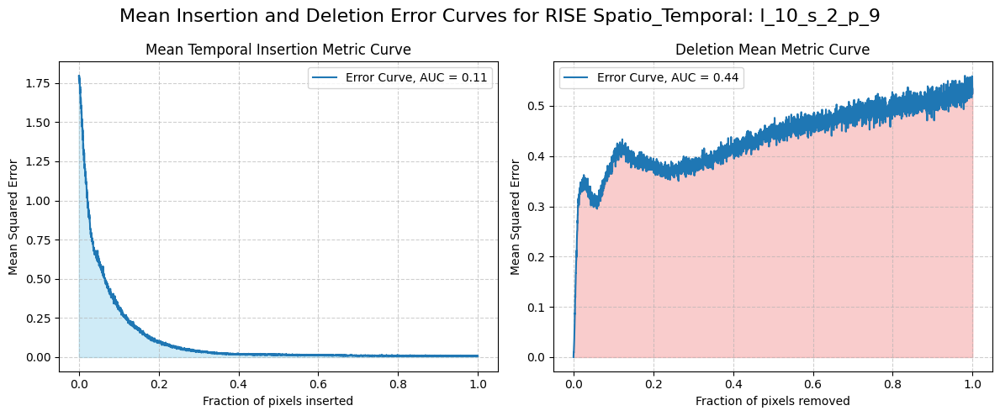

In [43]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 10
s = 2
p_values = [1,2,3,4,5,6,7,8,9]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

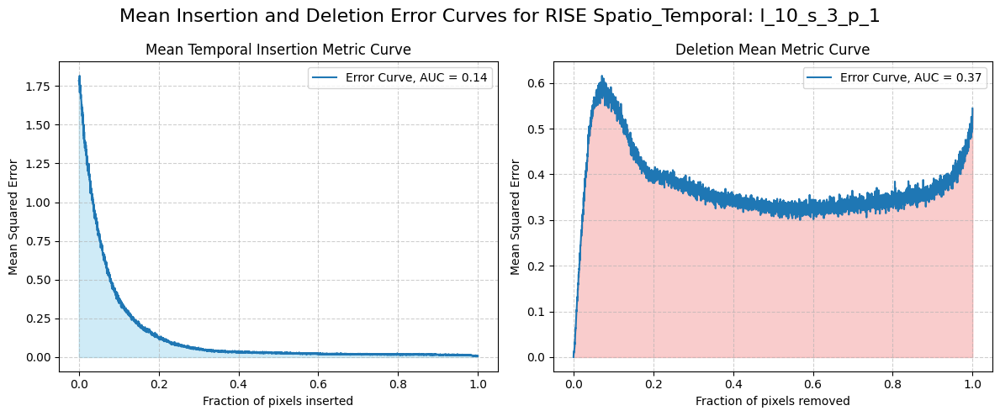

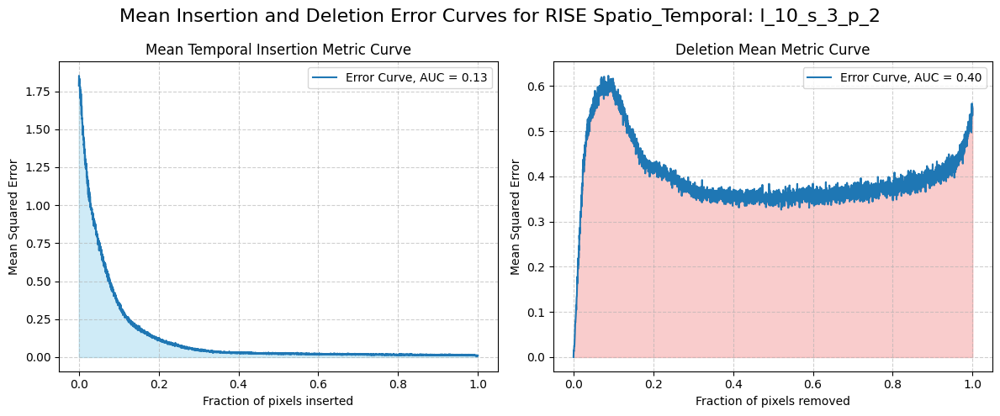

In [44]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 10
s = 3
p_values = [1,2]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

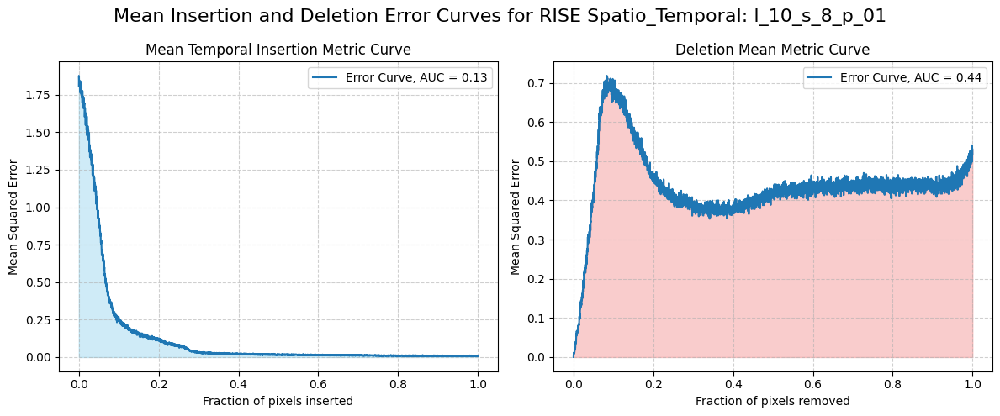

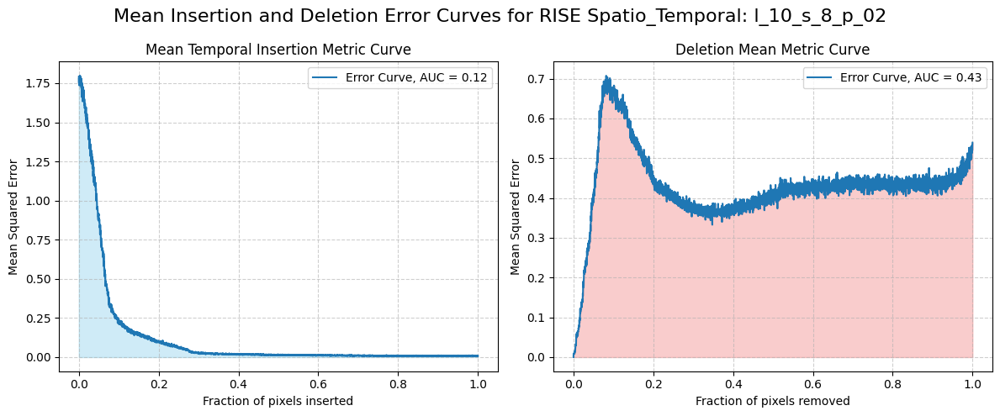

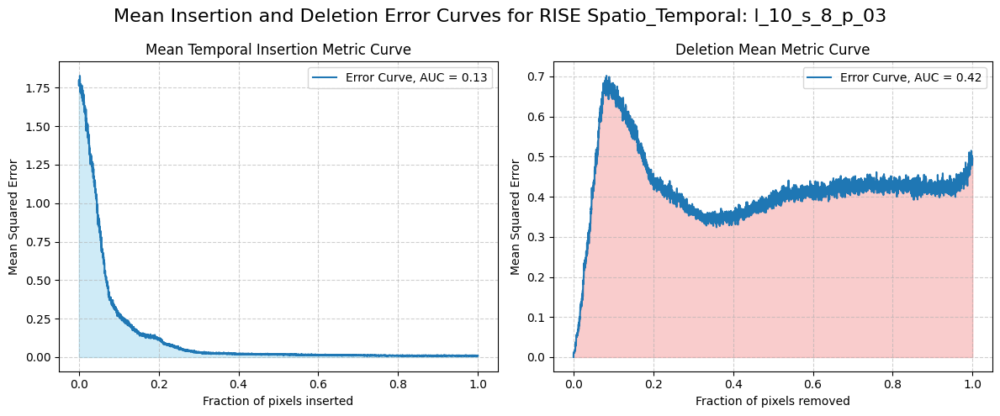

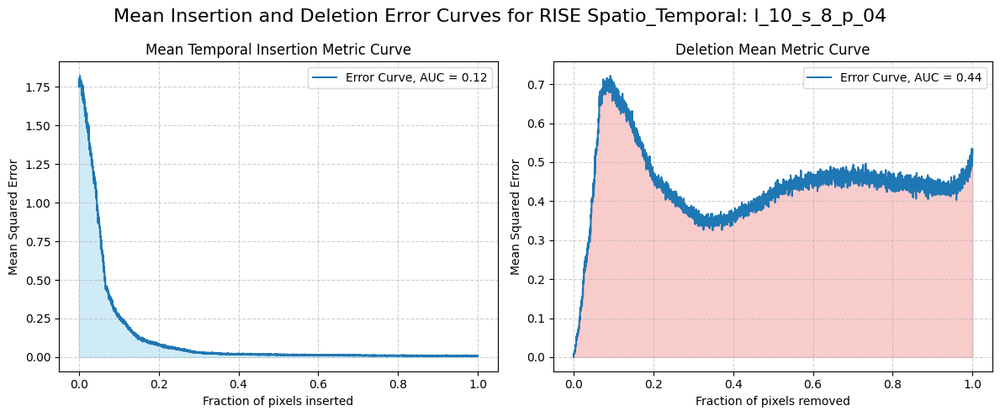

In [45]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 10
s = 8
p_values = [1,2,3,4]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_0{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

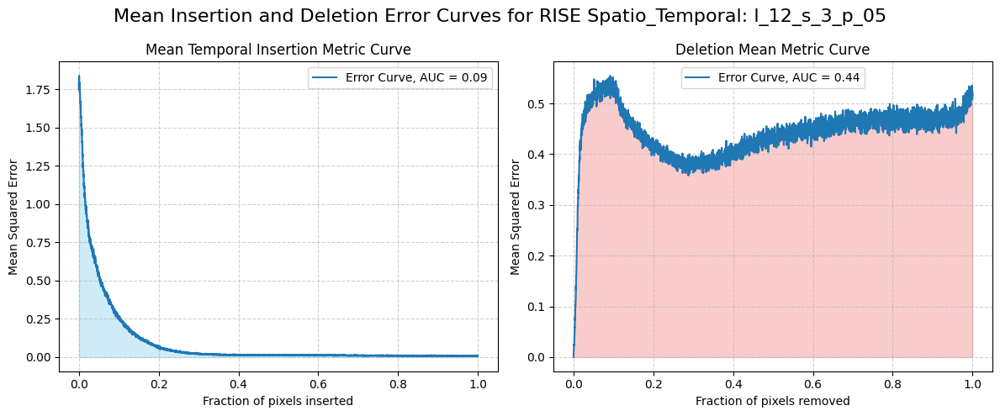

In [49]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 12
s = 3
p_values = [5]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_0{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

  nr_instance = 0

  #for nr_instance in range(0, len(vottignasco_test_image), 11):

  #saliency_video_i = result_st["saliency_videos"][nr_instance]
  #plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)

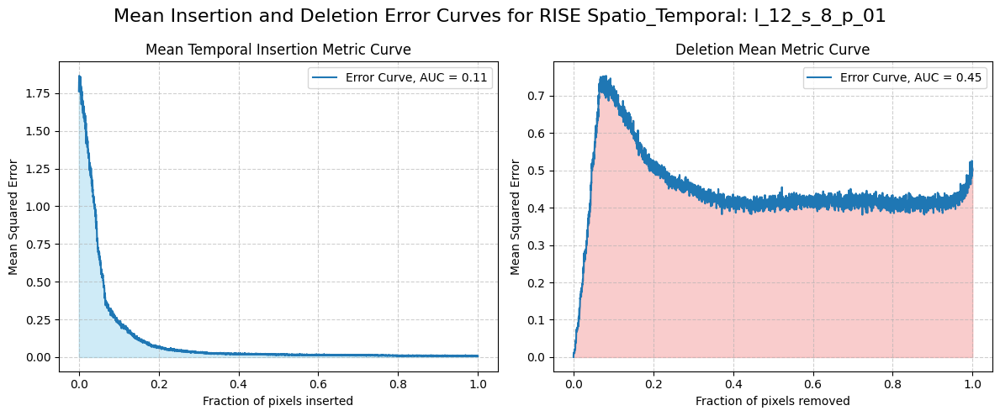

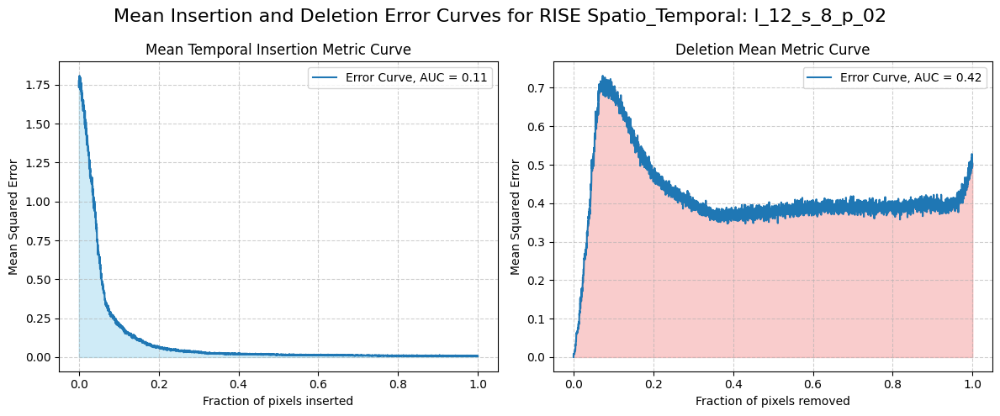

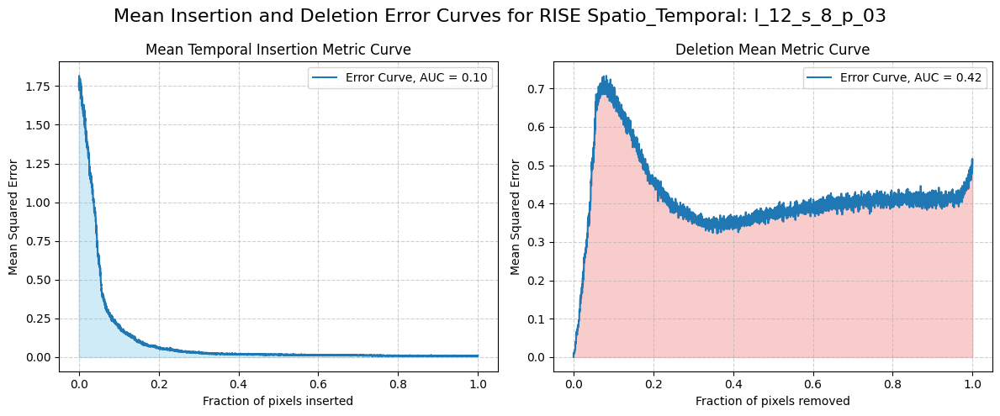

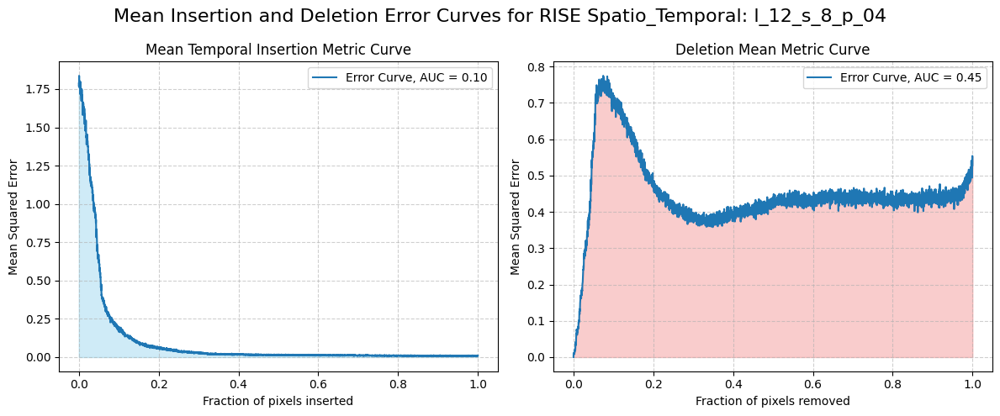

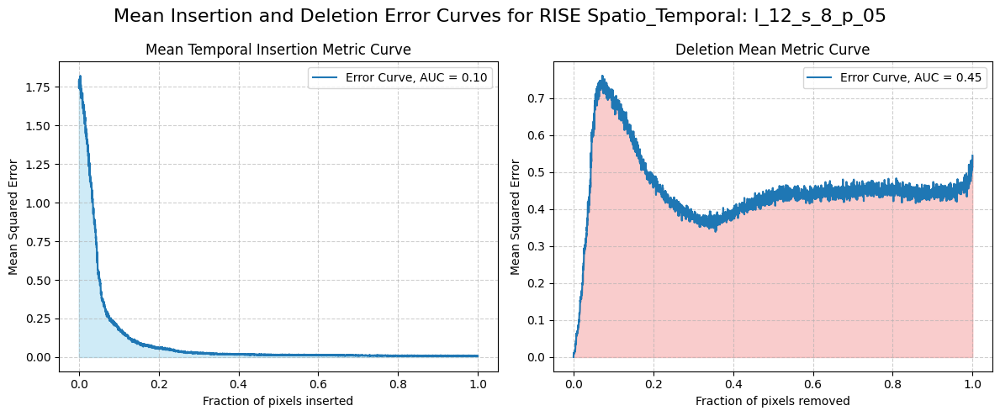

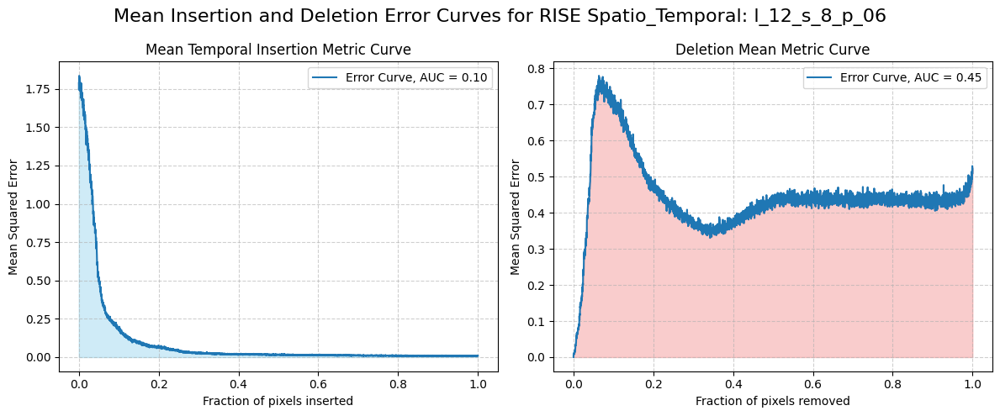

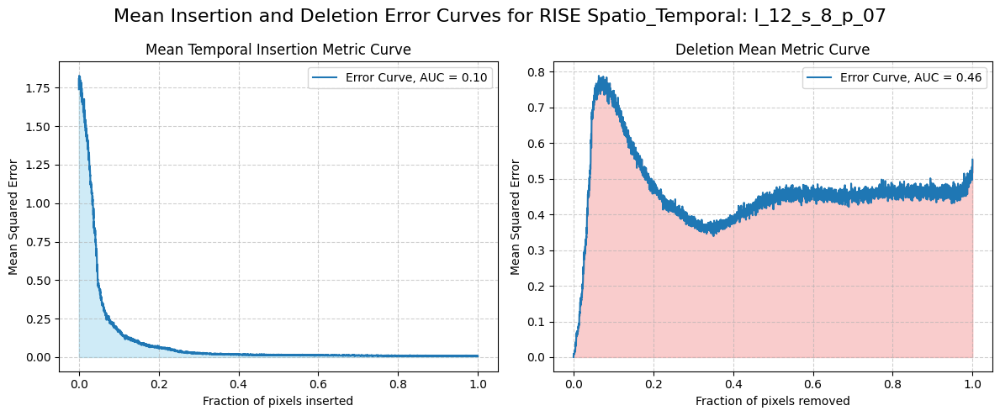

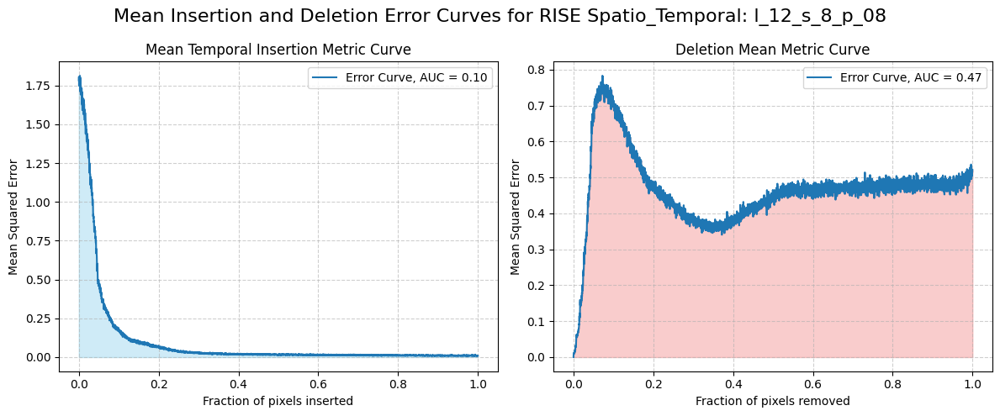

In [46]:
import pickle

path_to_load_results = os.path.join(work_path, "Water_Resources/rise-video/XAI/spatial_temporal/results/original_multiplicative_norm_zero/")

l = 12
s = 8
p_values = [1,2,3,4,5,6,7,8]

for p in p_values:
  results_string = f"st_results_setup_l_{l}_s_{s}_p_0{p}_inv_sigmoide.pkl"

  # Load della lista results da un file pickle
  with open(path_to_load_results + results_string, 'rb') as file:
    result_st = pickle.load(file)
  

  all_errors_insertion = result_st["errors_insertion"]
  all_errors_deletion = result_st["errors_deletion"]

# nr_instance = 0

# for nr_instance in range(0, len(vottignasco_test_image), 11):

#   saliency_video_i = result_st["saliency_videos"][nr_instance]
#   plot_sv_mean_per_season(saliency_video_i, nr_instance, cmap="PuBu")


  parameters = result_st["parameters_comb"]

  plot_combined_curves(all_errors_insertion, all_errors_deletion, parameters)